In [411]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
import matplotlib.font_manager as font_manager
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel
from scipy.spatial import distance_matrix
from scipy.spatial.distance import pdist, squareform, euclidean
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.stats import linregress, mannwhitneyu, kruskal
from statsmodels.stats.multitest import multipletests
import random
import ast
import pickle
import os
pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 50)

In [441]:
import matplotlib.colors as colors

def truncate_colormap(cmap, minval=0.4, maxval=1.0, n=1000):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

In [249]:
### as with all of these, the first time you run, set save to True and processed to False, then switch after
processed = True
save = False
#### need to get the days that they have in common and then drop out the uncommon days / unwanted days...
#### do you want to remove the 'outlier' days?
remove = False 

pickle_import = pickle.load(open('./processed_sorted_indiv_building_data_new.pkl', 'rb'))
sorted_b_7,sorted_b_61,sorted_b_84 = pickle_import['sorted_b_7'],pickle_import['sorted_b_61'],pickle_import['sorted_b_84']
combined_data = pd.concat([sorted_b_7,sorted_b_61,sorted_b_84], axis=0)
if processed:
    peaks_data_og_with_metab = pd.read_csv('./clustered_models_stability_cleaned_metals_mz_rt_metfrag_votes_named_new.csv', index_col=0)
else:
    peaks_data_og_with_metab = pd.read_csv('./models_stability_cleaned_metals_mz_rt_metfrag_votes_named_new.csv', index_col=0)
if not save:
    kmeans_7,kmeans_61,kmeans_84 = pickle.load(open('./kmeans_objects_5-6-19_new.pkl', 'rb'))

In [396]:
all_fs = list(peaks_data_og_with_metab['metfrag_matched_best_guess'].values)
level_4 = [f for f in all_fs if 'Da/' in f]
print('total level 4: ', len(level_4))
all_fs = [f for f in all_fs if f not in level_4]
level_3 = [f for f in all_fs if len(ast.literal_eval(f)[0])==4]
print('total level 3: ', len(level_3))
level_2 = [f for f in all_fs if f not in level_3]
print('total level 2: ', len(level_2))

total level 4:  805
total level 3:  257
total level 2:  363


In [250]:
### can we get all data with matching dates and find time courses that are similar and different ...euclidean distance...
### z-normalize on the whole data matrix

### start by filtering the days that are not in common for all.... (sadly will be a lot)
def split_dates(names):
    days = [ele.split('_') for ele in names]
    days = [ele[0]+'_'+ele[1].split('B')[0] for ele in days]
    remapper = {ele:name for ele,name in zip(days,names)}
    return days, remapper

### retrieve the data for only the common days, need to remap the extracted name to the real sample name first
def real_name_from_common(common_days, mapper):
    days = []
    for day in common_days:
        days.append(mapper[day])
    return days 

### ok, now we have common data. do Z-normalization on it all
def sort_date(month_df, sorted_df):
    month_dates = list(month_df.index)
    dates = []
    for date in month_dates:
        d = date.strip().split('B')[0]
        smaller_d = int(d.split('_')[1][1:])
        dates.append((smaller_d,date))
    names = sorted(dates, key=lambda x: x[0])
    sorted_date_names = [n[1] for n in names]
    sorted_month_df = month_df.loc[sorted_date_names]
    sorted_df.append(sorted_month_df)
    return sorted_df
def sort_month(unsorted_df):
    '''
    need o then n then d
        then inside each of these sort by date
    '''
    name_list = list(unsorted_df.index)
    oct_names = [name for name in name_list if 'O' in name]
    nov_names = [name for name in name_list if 'N' in name]
    dec_names = [name for name in name_list if 'D' in name]
    sorted_df_list = []
    for month in [oct_names, nov_names, dec_names]:
        sorted_df_list = sort_date(unsorted_df.loc[month], sorted_df_list)
    return pd.concat(sorted_df_list)

def z_norm(df):
    df_mean = df.mean(axis=0)
    df_std = df.std(axis=0)
    return (df-df_mean)/df_std

def calc_distance(m1,m2):
    '''
    this just does a feature to feature distance, no all possible combos
    '''
    dist = []
    for col in m1.columns:
        c1 = m1[col]
        c2 = m2[col]
        dist.append((euclidean(c1,c2),col))
    dist = sorted(dist, key=lambda x: x[0])
    return dist


days_7,remapper_7 = split_dates(list(sorted_b_7.index))
days_61,remapper_61 = split_dates(list(sorted_b_61.index))
days_84,remapper_84 = split_dates(list(sorted_b_84.index))
combined_days = [days_7, days_61, days_84]
common_days = set.intersection(*map(set, combined_days))
common_days_7 = real_name_from_common(common_days, remapper_7)
common_days_61 = real_name_from_common(common_days, remapper_61)
common_days_84 = real_name_from_common(common_days, remapper_84)
com_days_b_7 = sorted_b_7.loc[common_days_7]
com_days_b_61 = sorted_b_61.loc[common_days_61]
com_days_b_84 = sorted_b_84.loc[common_days_84]

### first perform the z-normalization protocol
z_norm_com_day_b_7 = z_norm(com_days_b_7).fillna(0)
z_norm_com_day_b_7 = sort_month(z_norm_com_day_b_7)
z_norm_com_day_b_61 = z_norm(com_days_b_61).fillna(0) 
z_norm_com_day_b_61 = sort_month(z_norm_com_day_b_61)
z_norm_com_day_b_84 = z_norm(com_days_b_84).fillna(0)
z_norm_com_day_b_84 = sort_month(z_norm_com_day_b_84)

#### calc distances between buildings on a metab-to-metab basis (not all to all)
b7_b61_dist = calc_distance(z_norm_com_day_b_7, z_norm_com_day_b_61)
b7_b84_dist = calc_distance(z_norm_com_day_b_7, z_norm_com_day_b_84)
b61_b84_dist = calc_distance(z_norm_com_day_b_61, z_norm_com_day_b_84)
# get the feature index for the best (ie closest features)
b7_b61_shared_good = [ele[1] for ele in b7_b61_dist if ele[0] < 3]
b7_b84_shared_good = [ele[1] for ele in b7_b84_dist if ele[0] < 3]
b61_b84_shared_good = [ele[1] for ele in b61_b84_dist if ele[0] < 3]
in_all = list(set(b7_b61_shared_good) | set(b7_b84_shared_good) | set(b61_b84_shared_good))
all_shared = list(set(b7_b61_shared_good) & set(b7_b84_shared_good) & set(b61_b84_shared_good))

####get the indicies of the features between building pairs with distances < 3:
dist_lt_3_b7_b61 = [ele for ele in b7_b61_dist if ele[0] < 3.0] 
dist_lt_3_b7_b84 = [ele for ele in b7_b84_dist if ele[0] < 3.0] 
dist_lt_3_b61_b84 = [ele for ele in b61_b84_dist if ele[0] < 3.0] 

In [252]:
def get_cluster_sizes_order(kmean_labels, old_labels):
    kmean_labels_str = [str(ele) for ele in kmean_labels]
    c_size = {}
    c_order = {}
    for ele, old_l in zip(kmean_labels_str, old_labels):
        if ele not in c_size:
            c_size[ele] = 1
            c_order[ele] = [old_l]
        else:
            c_size[ele] += 1
            c_order[ele].append(old_l)
    to_sort = [(k,v) for k,v in c_size.items()]
    sort_by_size = sorted(to_sort, key=lambda x:x[1], reverse=True)
    new_order = []
    for clusters in sort_by_size:
        new_order += c_order[clusters[0]]
    return sort_by_size, [int(ele) for ele in new_order], c_order

def cluster_sizes_for_plotting(sizes):
    plot_indicicies = []
    ind = 0
    for cluster in sizes:
        l = []
        l.append(ind)
        ind = cluster[1]+ind
        l.append(ind)
        plot_indicicies.append(l)
    return plot_indicicies

In [7]:
#### if you want to look at which clusters the various 'temporally similar' metabolites are in
if save:
    kmeans_7 = KMeans(n_clusters=100).fit(z_norm_com_day_b_7.T)
    kmeans_61 = KMeans(n_clusters=100).fit(z_norm_com_day_b_61.T)
    kmeans_84 = KMeans(n_clusters=100).fit(z_norm_com_day_b_84.T)
# here are the indicies of the close distance features in the various pairs. 
index_b7_b61 = set([ele[1] for ele in dist_lt_3_b7_b61])
index_b7_b84 = set([ele[1] for ele in dist_lt_3_b7_b84])
index_b61_b84 = set([ele[1] for ele in dist_lt_3_b61_b84])

old_labels_7= list(z_norm_com_day_b_7)
old_labels_61= list(z_norm_com_day_b_61)
old_labels_84= list(z_norm_com_day_b_84)
sorted_cluster_sizes_7, new_order_7, cluster_members_7 = get_cluster_sizes_order(kmeans_7.labels_.tolist(), old_labels_7)
sorted_cluster_sizes_61, new_order_61, cluster_members_61 = get_cluster_sizes_order(kmeans_61.labels_.tolist(), old_labels_61)
sorted_cluster_sizes_84, new_order_84, cluster_members_84 = get_cluster_sizes_order(kmeans_84.labels_.tolist(), old_labels_84)

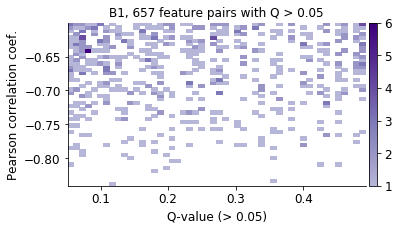

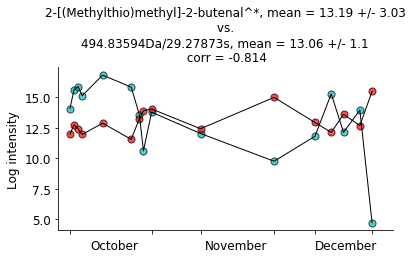

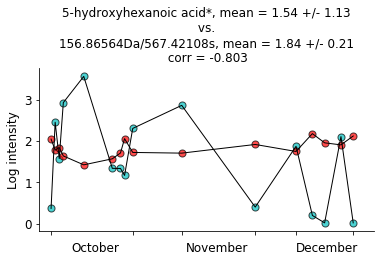

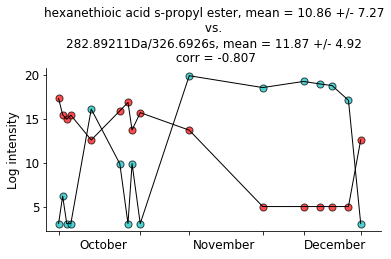

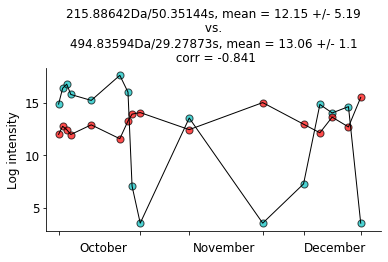

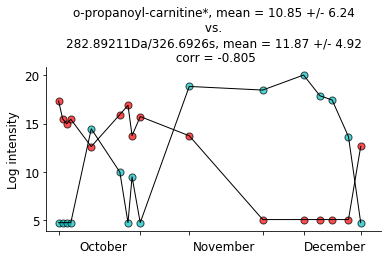

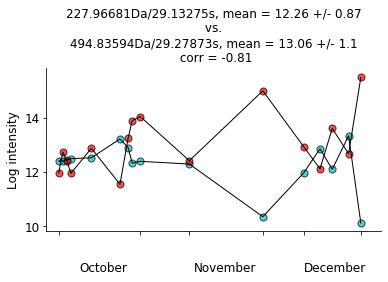

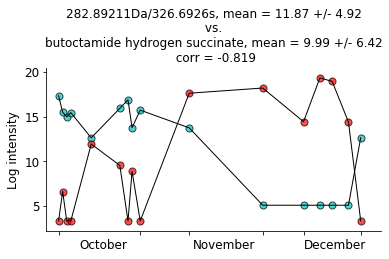

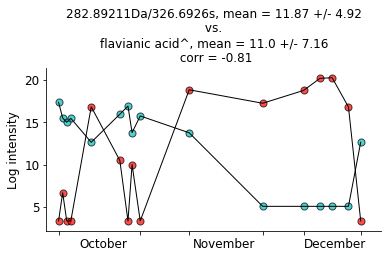

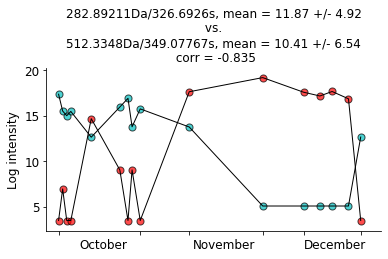

B1 :
 {'2-[(Methylthio)methyl]-2-butenal^': ['S-2-Propenyl propanethioate^', '2-Ethyldihydro-3(2H)-thiophenone^'], '5-hydroxyhexanoic acid': ['6-hydroxyhexanoic acid', '2-methyl-3-hydroxyvaleric acid', '2-hydroxy-3-methylpentanoic acid', '2-hydroxycaproic acid', '2-ethyl-2-hydroxybutyric acid', 'butoxyacetic acid', '3-hydroxyhexanoic acid', 'hydroxyisocaproic acid', '(r)-2-hydroxyisocaproate', '2-hydroxycaproic acid', 'dl-4-hydroxy caproic acid', '6-hydroxyhexanoic acid', '(5r)-5-hydroxyhexanoic acid', '2-hydroxy-3-methylpentanoic acid', '2-ethyl-2-hydroxybutyric acid', 'hydroxyisocaproic acid', '(s)-3-hydroxyhexanoic acid'], 'o-propanoyl-carnitine': ['o-propanoyl-carnitine', 'propionylcarnitine']}


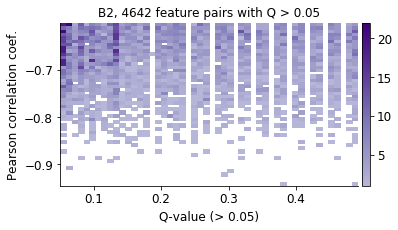

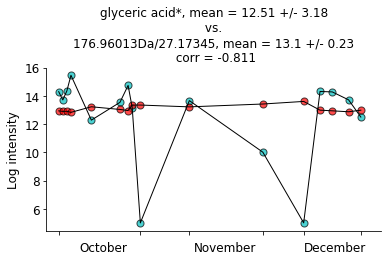

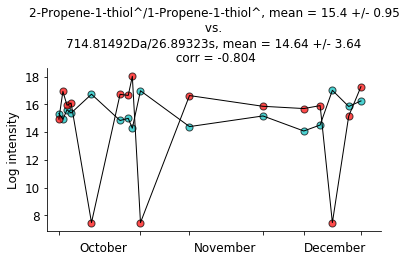

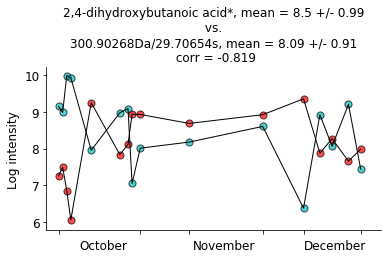

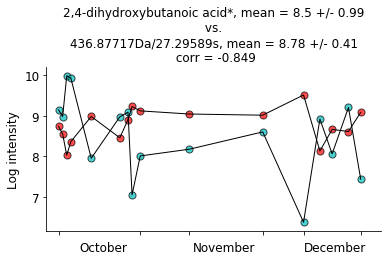

...

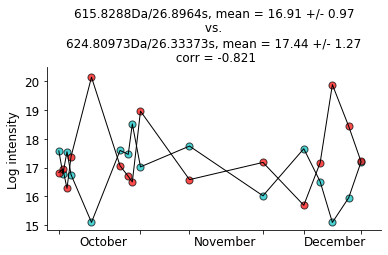

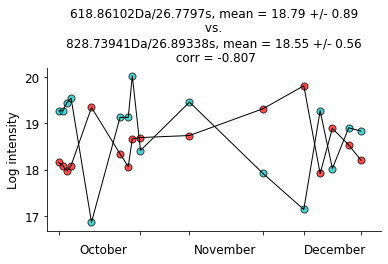

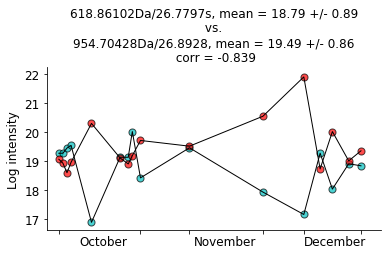

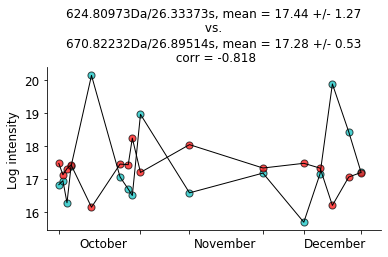

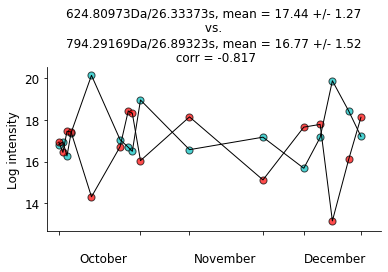

B2 :
 {'glyceric acid': ['d-2,3-dihydroxypropanoic acid'], '2,4-dihydroxybutanoic acid': ['4-deoxy-erythronic acid', 'd-threose', '2,4-dihydroxybutanoic acid', '4-deoxythreonic acid'], 'phosphinic acid^': ['phosphonous acid^', 'phosphinic acid^', 'phosphonous acid^'], 'iminodiacetate': ['aspartate', '1-deoxy-1-(n6-lysino)-d-fructose', 'iminodiacetic acid'], 'pancratistatin': ['dihyroxy-1h-indole glucuronide i'], 'oxoglutaric acid': ['3-oxoglutaric acid', '2-oxoglutarate', 'methyloxaloacetate'], '2,3-dihydroxybutanedioic acid': ['(s,s)-tartaric acid'], '2-deoxy-ribonic acid': ['2-deoxypentonic acid', 'arabinofuranose', 'd-apiose', 'beta-d-ribopyranose', 'r-thmf', 'apiose', 'd-arabinofuranose'], '2-methylene-4-oxopentanedioic acid': ['fumarylacetic acid', '3-hydroxy-cis,cis-muconic acid', '(z)-5-oxohex-2-enedioic acid', '2-maleylacetate', '2-hydroxymuconate', 'gamma-oxalocrotonate', '3-hydroxy-cis,cis-muconate', '2-methylene-4-oxopentanedioic acid', '2-methylene-4-oxopentanedioic acid'],

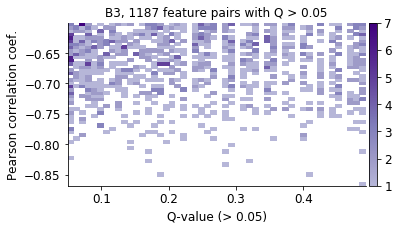

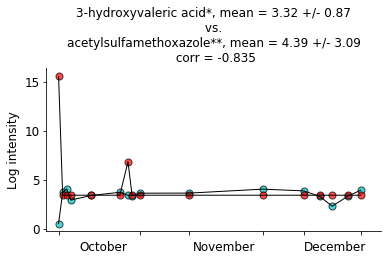

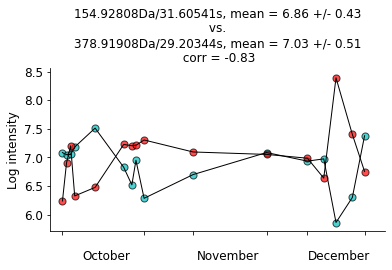

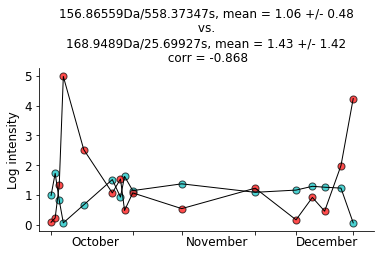

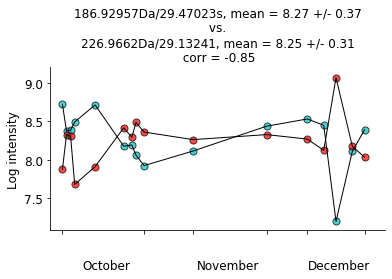

...

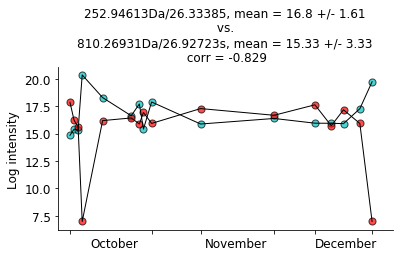

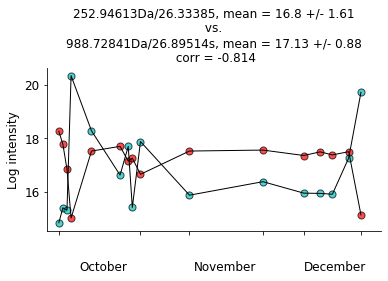

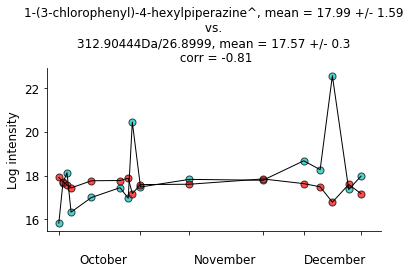

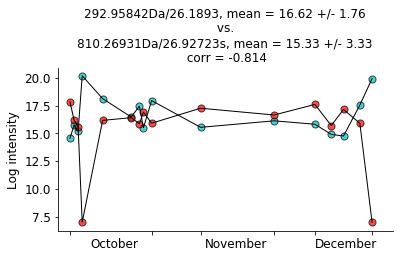

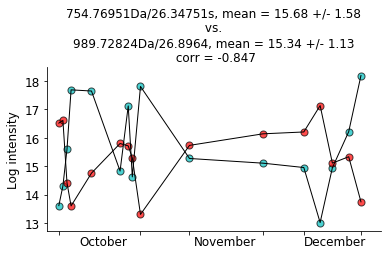

B3 :
 {'3-hydroxyvaleric acid': ['4-hydroxy-valeric acid', '5-hydroxypentanoic acid', '3-hydroxyisovaleric acid', '4-hydroxyisovaleric acid', 'methyl 3-hydroxybutyrate', '5-hydroxypentanoic acid', '4-hydroxyisovaleric acid', '3-hydroxyvaleric acid', '3-hydroxyisovaleric acid', '5-hydroxypentanoate', '3-hydroxyisovalerate'], 'acetylsulfamethoxazole': ['n4-acetylsulfamethoxazole'], 'tg(18:0': ['20:4(5z,8z,11z,14z)', '18:1(9z))^', 'triacylglycerol 56:5^']}


In [470]:
### looking for anticorrelated behavior:
def get_indicies_anticorr(df, ct=-0.7):
    inds = list(df.index)
    anticorr = []
    for i1 in inds:
        for i2 in inds:
            if int(i1)>=int(i2):
                continue
            else:
                if df.loc[i1,i2] < ct:
                    anticorr.append((i1,i2))
    return anticorr

def check_intmin(df, anticorr_list, min_int=6, min_std=1, use_std=False):
    gt_min_anticorr = []
    for pair in anticorr_list:
        if (df[pair[0]].mean() > min_int and df[pair[1]].mean() > min_int):
            if use_std:
                if (df[pair[0]].std() > min_std and df[pair[1]].std() > min_std):
                    gt_min_anticorr.append(pair)
            else:
                gt_min_anticorr.append(pair)
    return gt_min_anticorr

def get_named(df, name_df, anticorr_list, both_named=False, both_lv2=False):
    named_anticorr = []
    for pair in anticorr_list:
        n1 = name_df.loc[pair[0],'metfrag_matched_best_guess']
        n2 = name_df.loc[pair[1],'metfrag_matched_best_guess']
        if ('Da/' in n1 and 'Da/' in n2):
            continue
        if both_named:
            if ('Da/' in n1 or 'Da/' in n2):
                continue
            else:
                if both_lv2:
                    if (len(ast.literal_eval(n1)[0]) == 2 and len(ast.literal_eval(n2)[0]) == 2):
                        named_anticorr.append(pair)
                    else:
                        continue
                else:
                    named_anticorr.append(pair)  
        else:
            named_anticorr.append(pair)
    return named_anticorr

def get_metab_name(name_df, ind):
    n = name_df.loc[ind,'metfrag_matched_best_guess']
    if 'Da/' in n:
        return n
    else:
        n = ast.literal_eval(n)
        l = []
        for ele in n:
            if ele[0][-2:]=='**':
                l.append(ele[0][:-2]+'^')
            else:
                l.append(ele[0])
        n = '/'.join(l)
        return n
        
def comb_plot_b_anticorrs(anticorrs, corr_mats, com_day_bs, name_df=peaks_data_og_with_metab):
    all_names = {}
    for ele in anticorrs:
        fig = plt.figure(figsize=(6,5))
        gs = GridSpec(ncols=1,nrows=3, figure=fig, hspace=0.35)
        for corr_mat, com_day_b, gs_i in zip(corr_mats, com_day_bs,[0,1,2]):
            ax = fig.add_subplot(gs[gs_i])
            corr = corr_mat.loc[ele[0],ele[1]]       
            n1 = get_metab_name(name_df, ele[0])
            n2 = get_metab_name(name_df, ele[1]) 
            new_names = []
            for i,name in enumerate([n1,n2]):
                if len(name) < 40:
                    new_names.append(name)
                    continue
                if '/' in name:
                    name = name.split('/')
                    if name[0] in all_names:
                        if i == 0:
                            new_names.append(name[0]+'*')
                        else:
                            new_names.append(name[0]+'**')
                    else:
                        all_names[name[0]] = name[1:]
                        if i == 0:
                            new_names.append(name[0]+'*')
                        else:
                            new_names.append(name[0]+'**')
                else:
                    new_names.append(name)
            n1,n2 = new_names
            if gs_i == 0:
                name = n1 + '\n vs. \n' + n2 + '\n B-{} corr = {}'.format(gs_i+1,round(corr,3))
            else:
                name = 'B-{} corr= {}'.format(gs_i+1,round(corr,3))
            ax.set_title(name, fontname='sans-serif', fontsize=12)
            ax.set_xticks([1,21,33,51,61,75])
            ax.set_xticklabels([])
            ax.set_xlim([-2,80])
            ser1_min = com_day_b[ele[0]].min()
            ser2_min = com_day_b[ele[1]].min()
            min_int = min(ser1_min, ser2_min)
            ax.scatter([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75],com_day_b[ele[0]], c='c', s=50, alpha=0.7, edgecolor='k')
            ax.plot([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75], com_day_b[ele[0]], c='k', linewidth=1)
            ax.scatter([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75],com_day_b[ele[1]], c='r', s=50, alpha=0.7, edgecolor='k')
            ax.plot([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75], com_day_b[ele[1]], c='k', linewidth=1)
            if gs_i == 2:
                ymin, ymax = ax.get_ylim()
                loc,_ = plt.yticks()
                tick_delta = loc[1]-loc[0]
                if tick_delta <=2.5:
                    subtract = 1.5
                elif 2.5 < tick_delta < 5:
                    subtract = 2.0
                else:
                    subtract = 4.0
                print(tick_delta)
                ax.text(6,ymin-subtract,'October',fontname='sans-serif', fontsize=12)
                ax.text(34,ymin-subtract,'November', fontname='sans-serif', fontsize=12)
                ax.text(61,ymin-subtract,'December', fontname='sans-serif', fontsize=12)
            if gs_i == 1:
                ax.set_ylabel('Log intensity', fontname='sans-serif', fontsize=12)
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
        plt.savefig('anticorr_{}_{}_corr_{}.svg'.format('_'.join(n1.split('/')),'_'.join(n2.split('/')),round(corr,3)), format='svg', dpi=1000, bbox_inches='tight')
        plt.show()
    print(all_names)
    
def get_diffs(pd_series):
    pd_series = np.reshape(pd_series.values, (-1,1))
    diff_pd_series = pd_series - pd_series.T
    diff_pd_series = squareform(np.abs(diff_pd_series))
    return diff_pd_series

def plot_corr_otherfeat(diff_1, diff_2,xax='None',yax='None',title='None',ylim=[-1,1],color = 'Blues',top=False, middle=False,bottom=False):
    fig = plt.figure(figsize=(6, 1.5))
    ax = plt.subplot()
    cmap = plt.get_cmap(color)
    new_cmap = truncate_colormap(cmap,minval=0.3, maxval=1)
    counts, xedges, yedges, im = ax.hist2d(diff_1, diff_2, bins=60, cmin=0.3, cmap=new_cmap) # 60 bins 1.5, 75 for full
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_ylim(ylim)
#     cbar = ax.figure.colorbar(im,fraction=0.0305, pad=0.04,aspect=30)
    cbar = ax.figure.colorbar(im, pad=0.04)
    cbar.ax.locator_params(nbins=6)
    if middle:
        cbar.ax.set_ylabel('Bin Counts', rotation=-90, va="bottom", fontsize=12)  
        ax.set_ylabel(yax,fontname='sans-serif', fontsize=12)
        ax.set_xlabel('',fontname='sans-serif', fontsize=12)
        ax.set_xticklabels([])
    if top:
        ax.set_xlabel('',fontname='sans-serif', fontsize=12)
        ax.set_ylabel('',fontname='sans-serif', fontsize=12)
        ax.set_xticklabels([])
    if bottom:
        ax.set_xlabel(xax,fontname='sans-serif', fontsize=12)
        ax.set_ylabel('',fontname='sans-serif', fontsize=12)
        for label in (ax.get_xticklabels()):
            label.set_fontsize(12)
            label.set_fontname('sans-serif')
    for label in (ax.get_yticklabels()):
        label.set_fontsize(12)
        label.set_fontname('sans-serif')
#     if save:
    plt.savefig('corr_plot_ylim_{}_{}_{}_{}.svg'.format(str(ylim[0])+'-'+str(ylim[1]),xax,yax,title), format='svg', dpi=1000, bbox_inches='tight')


def fix_nans(df):
    if df.isnull().sum().sum() == 0:
        return df
    else:
        return df.fillna(0)
                      
### get the shared days and sorted for the NON-z-normalized vaues 
com_day_b_7 = sort_month(com_days_b_7)
com_day_b_61 = sort_month(com_days_b_61)
com_day_b_84 = sort_month(com_days_b_84)
### calc pearson correlations:
corr_z_b7 = z_norm_com_day_b_7.corr()
corr_z_b61 = z_norm_com_day_b_61.corr()
corr_z_b84 = z_norm_com_day_b_84.corr()
### fix the new nans due to the feature not being present with 0 corr to be safe
corr_z_b7 = fix_nans(corr_z_b7)
corr_z_b61 = fix_nans(corr_z_b61)
corr_z_b84 = fix_nans(corr_z_b84)


##### getting pairs of highly anti correlated features
def plot_b_anticorrs(anticorrs, corr_mat, com_day_b, building, name_df=peaks_data_og_with_metab):
    all_names = {}
    for j,ele in enumerate(anticorrs):
        m1,sd1 =com_day_b[ele[0]].mean(),com_day_b[ele[0]].std()
        m2,sd2 = com_day_b[ele[1]].mean(),com_day_b[ele[1]].std()
        corr = corr_mat.loc[ele[0],ele[1]]
        fig = plt.figure(figsize=(6,3))
        n1 = get_metab_name(name_df, ele[0])
        n2 = get_metab_name(name_df, ele[1]) 
        new_names = []
        for i,name in enumerate([n1,n2]):
            if len(name) < 40:
                new_names.append(name)
                continue
            if '/' in name:
                name = name.split('/')
                if name[0] in all_names:
                    if i == 0:
                        new_names.append(name[0]+'*')
                    else:
                        new_names.append(name[0]+'**')
                else:
                    all_names[name[0]] = name[1:]
                    if i == 0:
                        new_names.append(name[0]+'*')
                    else:
                        new_names.append(name[0]+'**')
            else:
                new_names.append(name)
        n1,n2 = new_names
        name = n1 + ', mean = {} +/- {}\n vs. \n'.format(round(m1,2),round(sd1,2)) + n2 + ', mean = {} +/- {}\n corr = {}'.format(round(m2,2),round(sd2,2),round(corr,3))
        ax = plt.subplot()
        ax.set_xticks([1,21,33,51,61,75])
        ax.set_xticklabels([])
        ax.set_xlim([-2,80])
        ser1_min = com_day_b[ele[0]].min()
        ser2_min = com_day_b[ele[1]].min()
        min_int = min(ser1_min, ser2_min)
        ax.scatter([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75],com_day_b[ele[0]], c='c', s=50, alpha=0.7, edgecolor='k')
        ax.plot([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75], com_day_b[ele[0]], c='k', linewidth=1)
        ax.scatter([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75],com_day_b[ele[1]], c='r', s=50, alpha=0.7, edgecolor='k')
        ax.plot([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75], com_day_b[ele[1]], c='k', linewidth=1)
        ymin, ymax = ax.get_ylim()
        loc,_ = plt.yticks()
        tick_delta = loc[1]-loc[0]
        if tick_delta <= 1.5:
            subtract = 0.5
        elif 1.5 < tick_delta <=2.5:
            subtract = 1.5
        elif 2.5 < tick_delta <= 5:
            subtract = 2.0
        else:
            subtract = 4.0
        ax.text(6,ymin-subtract,'October',fontname='sans-serif', fontsize=12)
        ax.text(34,ymin-subtract,'November', fontname='sans-serif', fontsize=12)
        ax.text(61,ymin-subtract,'December', fontname='sans-serif', fontsize=12)
        ax.set_ylabel('Log intensity', fontname='sans-serif', fontsize=12)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.set_title(name, fontname='sans-serif', fontsize=12)
        plt.savefig('{}_anticorr_corr_{}_not_statsig_{}.svg'.format(building, round(corr,3), j), format='svg', dpi=1000, bbox_inches='tight')
        plt.show()
    print(building, ':\n', all_names)
    
def get_pairs(corr_mat):
    pairs = []
    corrs = []
    for col in list(corr_mat.columns):
        pairs += [(col,ele,corr_mat.loc[ele,col]) for ele in list(corr_mat[col][corr_mat[col]<-0.6].index)]
    seen = []
    new_pairs = []
    for p in pairs:
        if p not in seen:
            seen.append(p)
            seen.append((p[1],p[0],p[2]))
            new_pairs.append(p)
    return new_pairs

def get_samestats_anticorr(df, pairs, building):
    p = np.zeros(len(pairs)) + np.nan
    pair_qs = np.zeros(len(pairs)) + np.nan
    means = df.mean(axis=0)
    std = df.std(axis=0)
    for i,pair in enumerate(pairs):
        pair_qs[i] = pair[2]
        try:
            _,p[i] = mannwhitneyu(df[pair[0]], df[pair[1]])
        except:
            if set(df[pair[0]]) == set(df[pair[0]]):
                p[i] = 1
    _, p[~np.isnan(p)], _, _ = multipletests(p[~np.isnan(p)], alpha=0.00001, method='fdr_bh')
    fig = plt.figure(figsize=(6, 3))
    ax = plt.subplot()
    pairs_array = np.asarray(pairs)
    large_p = p[p>0.05]
    large_pair_qs = pair_qs[p>0.05]
    large_p_pairs_array = pairs_array[p>0.05,:]
    large_p_pairs_array = large_p_pairs_array[large_p_pairs_array[:,2]<-0.8]
    large_p_pairs_list = [l.tolist() for l in list(large_p_pairs_array[:,:2].astype(int))]

    plt.title('{}, {} feature pairs with Q > 0.05'.format(building,p[p>0.05].shape[0]), fontname='sans-serif', fontsize=12)
    cmap = plt.get_cmap('Purples')
    cmap = truncate_colormap(cmap, minval=0.4, maxval=1)
    counts, xedges, yedges, im = ax.hist2d(large_p,large_pair_qs,bins=50, cmin=0.1, cmap=cmap)
    cbar = plt.colorbar(im, ax=ax, fraction=.1, pad=0.01)
    cbar.ax.tick_params(labelsize=12) 
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_ylabel('Pearson correlation coef.',fontname='sans-serif', fontsize=12)
    ax.set_xlabel('Q-value (> 0.05)',fontname='sans-serif', fontsize=12)
    plt.savefig('correlation_significance_{}.svg'.format(building), format='svg', dpi=1000, bbox_inches='tight')
    plt.show()
    return large_p_pairs_list

buildings = ['B1','B2','B3']
for corr_b, com_day_b, building in zip([corr_z_b7,corr_z_b61,corr_z_b84], [com_day_b_7,com_day_b_61,com_day_b_84], buildings):
    anti_corr_pairs = get_pairs(corr_b)
    b_samestat_highanti = get_samestats_anticorr(com_day_b, anti_corr_pairs, building)
    plot_b_anticorrs(b_samestat_highanti, corr_b, com_day_b,building)

    
    
######### getting number for different 'anticorrelated' levels
# print(corr_z_b7[corr_z_b7<-0.6].count().sum()/2)
# print(corr_z_b61[corr_z_b61<-0.6].count().sum()/2)
# print(corr_z_b84[corr_z_b84<-0.6].count().sum()/2)
# combined_anti_corr = corr_z_b84[corr_z_b84<-0.2] + corr_z_b7[corr_z_b7<-0.2] + corr_z_b61[corr_z_b61<-0.2]
# print(combined_anti_corr.count().sum()/2)
##### 39010 out of 2029200


#### plot the full correlation distribution to get a sense of what is going on.
#### plot correlation v delta mass, delta rt, delta mean intensity
# diff_mz = get_diffs(peaks_data_og_with_metab['mz'])
# diff_rt = get_diffs(peaks_data_og_with_metab['rt'])
# lin_corr_z_b7 = squareform(corr_z_b7, checks=False)
# lin_corr_z_b61 = squareform(corr_z_b61, checks=False)
# lin_corr_z_b84 = squareform(corr_z_b84, checks=False)

# # full_plots = True
# # if full_plots:
# #     for diff_1,n1 in zip([diff_mz, diff_rt],['delta mz','delta rt']):
# #         for diff_2,title in zip([lin_corr_z_b7, lin_corr_z_b61,lin_corr_z_b84],['B1','B2','B3']):
# #             plot_corr_otherfeat(diff_1, diff_2, n1, 'Pearson correlation coef.', title, [-1,1])
            
# lin_corr_z_b7_args = np.argsort(lin_corr_z_b7)
# lin_corr_z_b61_args = np.argsort(lin_corr_z_b61)
# lin_corr_z_b84_args = np.argsort(lin_corr_z_b84)
# xax,yax,ylim = 'Delta mz', 'Pearson correlation coef.', [-1,-.6]
# num_to_keep = 7000
# lin_corr_z_b7 = lin_corr_z_b7[lin_corr_z_b7_args][:num_to_keep]
# diff_rt_7 = diff_rt[lin_corr_z_b7_args][:num_to_keep]
# diff_mz_7 = diff_mz[lin_corr_z_b7_args][:num_to_keep]
# title = 'B1'
# plot_corr_otherfeat(diff_mz_7, lin_corr_z_b7,xax,yax,title,ylim, top=True)

# num_to_keep = 32000
# lin_corr_z_b61 = lin_corr_z_b61[lin_corr_z_b61_args][:num_to_keep]
# diff_rt_61 = diff_rt[lin_corr_z_b61_args][:num_to_keep]
# diff_mz_61 = diff_mz[lin_corr_z_b61_args][:num_to_keep]
# title = 'B2'
# plot_corr_otherfeat(diff_mz_61, lin_corr_z_b61,xax,yax,title,ylim, middle=True)

# num_to_keep = 8000
# lin_corr_z_b84 = lin_corr_z_b84[lin_corr_z_b84_args][:num_to_keep]
# diff_rt_84 = diff_rt[lin_corr_z_b84_args][:num_to_keep]
# diff_mz_84 = diff_mz[lin_corr_z_b84_args][:num_to_keep]
# title = 'B3'
# plot_corr_otherfeat(diff_mz_84, lin_corr_z_b84,xax,yax,title,ylim, bottom=True)

indiv_anti_ts = False
if indiv_anti_ts:
    anticorr_7 = get_indicies_anticorr(corr_z_b7)
    anticorr_61 = get_indicies_anticorr(corr_z_b61)
    anticorr_84 = get_indicies_anticorr(corr_z_b84)
    anticorr_7 = check_intmin(com_day_b_7, anticorr_7, use_std=True)
    anticorr_61 = check_intmin(com_day_b_61, anticorr_61, use_std=True)
    anticorr_84 = check_intmin(com_day_b_84, anticorr_84, use_std=True)
    anticorr_7 = get_named(com_day_b_7, peaks_data_og_with_metab, anticorr_7, both_named=True, both_lv2=False)
    anticorr_61 = get_named(com_day_b_61, peaks_data_og_with_metab, anticorr_61, both_named=True, both_lv2=False)
    anticorr_84 = get_named(com_day_b_84, peaks_data_og_with_metab, anticorr_84, both_named=True, both_lv2=False)
    combined_anti = list(set(anticorr_61 + anticorr_84 + anticorr_7))
    comb_plot_b_anticorrs(combined_anti, [corr_z_b7,corr_z_b61,corr_z_b84], [com_day_b_7,com_day_b_61,com_day_b_84])

In [384]:
# total non identical, symmetry removed feature pairs: (1425*1425 - 1425)/2
19505/1014600

0.019224324857086538

/home/ubuntu/data/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  from ipykernel import kernelapp as app


<Figure size 432x288 with 0 Axes>

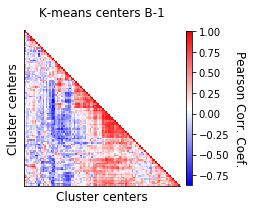

<Figure size 432x288 with 0 Axes>

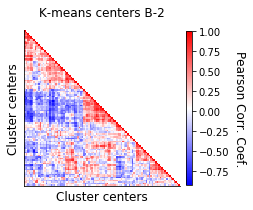

<Figure size 432x288 with 0 Axes>

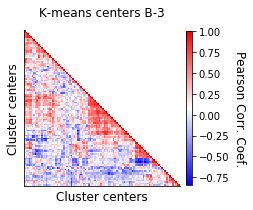

In [368]:
###### looking are correlation through time from the kmeans centers
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage,dendrogram
centers_km_7 = pd.DataFrame(kmeans_7.cluster_centers_, columns=com_day_b_7.index).T
centers_km_61 = pd.DataFrame(kmeans_61.cluster_centers_, columns=com_day_b_61.index).T
centers_km_84 = pd.DataFrame(kmeans_84.cluster_centers_, columns=com_day_b_84.index).T
corr_km_b7 = centers_km_7.corr()
corr_km_b61 = centers_km_61.corr()
corr_km_b84 = centers_km_84.corr()

### get the ordering
def plot_clustered_corr_mat(centers, corr_mat,b):
    title = 'K-means centers B-{}'.format(b)
    X = squareform(pdist(centers.values.T, 'correlation'))
    Z = linkage(X, method='ward')
    clustering = dendrogram(Z)
    plt.clf()
    fig = plt.figure(figsize=(3,3))
    ax = plt.subplot()
    order = clustering['ivl']
    order = [int(i) for i in order]
    corr_km = corr_mat.loc[order, order].reset_index(drop=True)
    corr_km.columns = list(corr_km.index)
    for i in corr_km:
        for j in corr_km:
            if j > i:
                corr_km.iloc[i,j] = np.NaN
    im = ax.matshow(corr_km, cmap='bwr')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_title(title,fontname='sans-serif', fontsize=12)
    ax.set_xlabel('Cluster centers',fontname='sans-serif', fontsize=12)
    ax.set_ylabel('Cluster centers',fontname='sans-serif', fontsize=12)
    ax.set_xticks([])
    ax.set_yticks([])
    cbar = ax.figure.colorbar(im,fraction=0.0305, pad=0.04,aspect=30)
    cbar.ax.tick_params(labelsize=10) 
    cbar.ax.set_ylabel('Pearson Corr. Coef.', rotation=-90, va="bottom", fontsize=12)
    cbar.ax.locator_params(nbins=8)
    plt.savefig('heirarch_cluster_km_center_b_3dim_{}.svg'.format(b), format='svg', dpi=1000, bbox_inches='tight')
    plt.show()
plot_clustered_corr_mat(centers_km_7, corr_km_b7, '1')
plot_clustered_corr_mat(centers_km_61, corr_km_b61, '2')
plot_clustered_corr_mat(centers_km_84, corr_km_b84, '3')

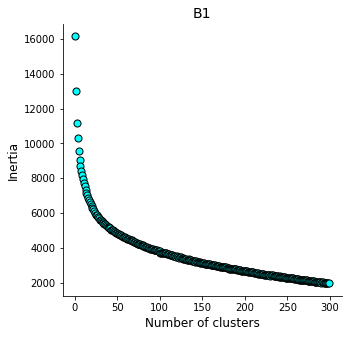

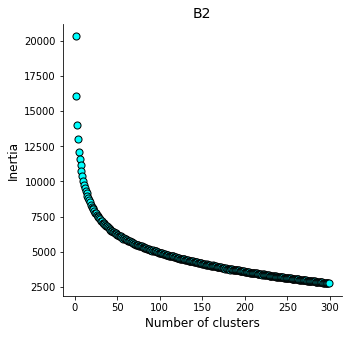

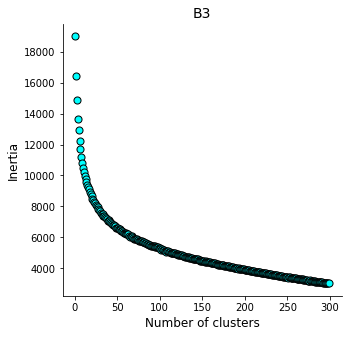

In [6]:
### play around with changing k for k means
def plot_kmean_kfinder(df, title):
    inertia = []
    ks=300
    for i in range(1,ks):
        df_km = KMeans(n_clusters=i).fit(df.T)
        inertia.append(df_km.inertia_)
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111)
    ax.scatter([i for i in range(1,ks)], inertia, s=50, c='cyan', edgecolor='black', linewidth=1)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_title(title,fontname='sans-serif', fontsize=14)
    ax.set_xlabel('Number of clusters',fontname='sans-serif', fontsize=12)
    ax.set_ylabel('Inertia',fontname='sans-serif', fontsize=12)
    plt.savefig('intertia_clusters_{}.svg'.format(title), format='svg', dpi=1000, bbox_inches='tight')
    plt.show()

plot_kmean_kfinder(z_norm_com_day_b_7, 'B1')
plot_kmean_kfinder(z_norm_com_day_b_61, 'B2')
plot_kmean_kfinder(z_norm_com_day_b_84, 'B3')

In [13]:
if not processed:
    peaks_data_og_with_metab['b7_cluster'] = kmeans_7.labels_.tolist()
    peaks_data_og_with_metab['b61_cluster'] = kmeans_61.labels_.tolist()
    peaks_data_og_with_metab['b84_cluster'] = kmeans_84.labels_.tolist()
print(peaks_data_og_with_metab[['b7_cluster', 'b61_cluster','b84_cluster']])

             b7_cluster  b61_cluster  b84_cluster
true_labels                                      
3                    38            9           90
6                    98           52            1
11                    0           28           47
12                    7           70           40
13                   14            1           10
16                    7            0           50
18                   50           46           82
20                   83           71           49
21                   50           55           83
22                   40           34           99
23                   59           38            2
24                   61           87           84
25                   67           92           37
26                   91           21           21
27                   37           19           11
28                   69           44           49
30                   93           18           64
33                   31           36           73


In [14]:
if save:
    print('saving')
    peaks_data_og_with_metab.to_csv('./clustered_models_stability_cleaned_metals_mz_rt_metfrag_votes_named_new.csv')
    pickle.dump([kmeans_7,kmeans_61,kmeans_84], open('./kmeans_objects_5-6-19_new.pkl', 'wb'))

saving


In [397]:
### plot of % features vs number of clusters
def get_building_cluster_fract(sorted_sizes):
    b_count = 0
    b_sum_to_date_list = []
    for ele in sorted_sizes:
        b_count += ele[1]
        b_sum_to_date_list.append(b_count)
    b_sum_to_date_list = [float(ele)/b_count for ele in b_sum_to_date_list]
    return b_sum_to_date_list
    
# x = [i for i in range(1,31)]
x = [i for i in range(1,101)]
b7_fract = get_building_cluster_fract(sorted_cluster_sizes_7)
b61_fract = get_building_cluster_fract(sorted_cluster_sizes_61)
b84_fract = get_building_cluster_fract(sorted_cluster_sizes_84)
print(b7_fract[49],b61_fract[49],b84_fract[49])
fig = plt.figure(figsize=(5,5))
ax = plt.subplot()
ax.scatter(x, b7_fract, c='c', s=30, alpha=0.75, edgecolor='k',linewidths=1.5)
ax.scatter(x, b61_fract, c='r', s=30, alpha=0.75, edgecolor='k',linewidths=1.5)
ax.scatter(x, b84_fract, c='y', s=30, alpha=0.75, edgecolor='k',linewidths=1.5)
ax.set_xlabel('Number of clusters', fontname='sans-serif', fontsize=14)
ax.set_ylabel('Fraction of features used', fontname='sans-serif', fontsize=14)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(12)
    tick.label.set_fontname('sans-serif')
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(12)
    tick.label.set_fontname('sans-serif')
legend_data = [['Building 1', 'c', 'k', 'o'],
               ['Building 2', 'r', 'k', 'o'],
               ['Building 3', 'y', 'k', 'o']]
patches_bar = []
for ele in legend_data:
    patches_bar.append(Line2D([0],[0], color='w', marker=ele[3],markerfacecolor=ele[1], markeredgecolor=ele[2], label=ele[0], markersize=6)) 
font = font_manager.FontProperties(family='sans-serif', style='normal', size=10)
lgd = ax.legend(handles=patches_bar, frameon=False, prop=font) 
plt.savefig('Fig3_percent_SI_new.svg', format='svg', dpi=1000, bbox_inches='tight')  
plt.show()

0.8175438596491228 0.7466666666666667 0.7178947368421053


In [16]:
def get_prior_cluster_size_dist(sorted_cluster_sizes):
    sizes = np.array([0 for i in range(len(sorted_cluster_sizes[0]))])
    for sorted_clust in sorted_cluster_sizes:
        for i, size in enumerate(sorted_clust):
            sizes[i] += size[1]
    sizes = np.divide(sizes,300.0)
    sizes = np.divide(sizes, sizes.sum())
    return sizes

def model_building(prior_cluster_sizes, clusters=100, size=(16,1425)):
    from scipy.stats import cauchy
    '''
    generate simulated data from the desired number of clusters 
    '''
    ### 1: for each cluster sample means which are then samples from:
    all_cluster_means = []
    for cluster in range(clusters):
        cluster_means = []
        for i in range(size[0]):
#             cluster_means.append(np.random.normal(scale=0.5))
            cauch_num = 5
            while abs(cauch_num) > 3.5:
                cauch_num = float(cauchy.rvs(loc=0, scale=0.3, size=1))
            cluster_means.append(cauch_num)
        all_cluster_means.append(cluster_means)
    all_cluster_means = np.asarray(all_cluster_means)
    ### 2: model in day baises across clusters...ie randomly take a day (or more randomly determined) and sample a new mean 
    ####     across clusters with these now tied somehow and randomly choose which clusters are linked in this manner (ie not all)
    num_spikes = abs(int(random.gauss(0,1)))
#     print('number of spikes: ', num_spikes)
    lam = 1
    seen_days = []
    for j in range(num_spikes):
        day_spike = random.randint(0,15)
        if day_spike not in seen_days:
            seen_days.append(day_spike)
        else:
            day_spike = seen_days[0]
            while day_spike not in seen_days:
                day_spike = random.randint(0,15)
                if day_spike in seen_days:
                    nothing = 0
                else:
                    seen_days.append(day_spike)
        num_linked_clusters = int(abs(random.gauss(0,1))*0.2*clusters)
        cluster_linked = []
        c = 0
        while len(cluster_linked) < num_linked_clusters:
            c += 1
            if c == 100000:
                break
            for i in range(clusters):
#                 x = i+1
                ran = random.random()
                clust_prob = 0.002+lam*np.exp(-lam*i)
                if ran <= clust_prob:
                    if i in cluster_linked:
                        pass
                    else:
                        cluster_linked.append(i)
        cauch_num = 2
        while abs(cauch_num) < 1.75: # 2.4
            cauch_num = float(cauchy.rvs(loc=0, scale=0.3, size=1))
            if abs(cauch_num) > 3: # 3.5
                cauch_num = 1.5 # 2
        for c in cluster_linked:
            all_cluster_means[c][day_spike] = np.random.normal(loc=cauch_num, scale=0.3)
            
    #### 2b: now just get normal metab correlations
    correl = abs(int(random.gauss(0,3)))
    lam = 0.8 ### larger lambda causes the probabily to drop faster with X....low lam give more probabilty to the later clusters being in the same distribution
    for j in range(correl):
        day_spike = random.randint(0,15)
        if day_spike not in seen_days:
            seen_days.append(day_spike)
        else:
            day_spike = 100
            while day_spike not in seen_days:
                day_spike = random.randint(0,15)
                if day_spike in seen_days:
                    day_spike = 100
                else:
                    seen_days.append(day_spike)
        num_linked_clusters = int(abs(random.gauss(0,1))*clusters*float(7/10))
        cluster_linked = []
        c = 0
        while len(cluster_linked) < num_linked_clusters:
            c += 1
            if c == 100000:
                break
            for i in range(clusters):
#                 x = i+1
                ran = random.random() 
                clust_prob = 0.002+lam*np.exp(-lam*i)
#                 print(0.002+lam*np.exp(-lam*1))
                if ran <= clust_prob:
                    if i in cluster_linked:
                        pass
                    else:
                        cluster_linked.append(i)
        cauch_num = 5
        while abs(cauch_num) > 1.75: #2
            cauch_num = float(cauchy.rvs(loc=0, scale=0.3, size=1))  
        for c in cluster_linked:
            all_cluster_means[c][day_spike] = np.random.normal(loc=cauch_num, scale=0.3)

    all_cluster_means = all_cluster_means.tolist()
    ### 3: take the means for each time point for each cluster and sample from these  
    start = True
    data = []
    for c_size_fract, c_means in zip(prior_cluster_sizes, all_cluster_means):
        for i in range(int(round(size[1]*c_size_fract)+1)):
            single_feat_time_series = []
            for pt_mean in c_means:
                pt_val = np.random.normal(loc=pt_mean, scale=0.3)
                if abs(pt_val) > 3.2:
                    while abs(pt_val) > 3.2:
                        pt_val = np.random.normal(loc=pt_mean, scale=0.3)
                single_feat_time_series.append(pt_val)
            data.append(single_feat_time_series)
    data = np.array(data).T
    if data.shape[1] > size[1]:
        to_drop = data.shape[1] - size[1]
        for i in range(to_drop):
            data = np.delete(data, np.random.randint(data.shape[1]), 1)
    np.random.shuffle(data)
    return data

def cluster_nam_to_size_list_to_dict(cluster_size_list):
    cluster_dict = {}
    for ele in cluster_size_list:
        cluster_dict[ele[0]] = ele[1]
    return cluster_dict

num_clusters = 100
### these should all be the same so it doesnt matter which building you take from
rows = list(z_norm_com_day_b_7.index)
col = list(z_norm_com_day_b_7.columns)

cluster_size_prior = get_prior_cluster_size_dist([sorted_cluster_sizes_7,sorted_cluster_sizes_61,sorted_cluster_sizes_84])       
### code used to optimized modeling but not for other analysis:
num_buildings = 1
use_known = False
if use_known:
    number_tot = num_buildings + 3
    building_data = [z_norm_com_day_b_7,z_norm_com_day_b_61,z_norm_com_day_b_84]
else:
    number_tot = num_buildings
    building_data = []
    
combo_percents = np.random.random_sample((number_tot,))
combo_percents /= combo_percents.sum()

### for just testing building making:
for i in range(num_buildings):
    fb = model_building(cluster_size_prior, clusters=num_clusters)
    fb = pd.DataFrame(fb, columns=col, index=rows)
    fb= z_norm(fb).fillna(0)
    building_data.append(fb)

### now combine the random with the real:
real_with_fake_building_data = np.zeros((16,1425))
for fract, building in zip(combo_percents, building_data):
    real_with_fake_building_data += fract*building.values
real_with_fake_building_data = pd.DataFrame(real_with_fake_building_data, columns=col,  index=rows)
### cluster the data:
kmeans_fake_real = KMeans(n_clusters=num_clusters).fit(real_with_fake_building_data.T)
old_labels_fake_real = list(real_with_fake_building_data)
sorted_cluster_sizes_fake_real, new_order_fake_real, cluster_members_fake_real = get_cluster_sizes_order(kmeans_fake_real.labels_.tolist(), old_labels_fake_real)

In [27]:
### for making the large paper plots of metabolite features + cluster + mz + rt + 5 largest clusters 
def make_plot_with_means(kmean_obj, data_mat, sorted_cluster_sizes, peaks_data_og_with_metab):
    def plot_time_series(ax, date_sorted_order_by_cluster, clusters_for_plotting, i):
        x_ = [1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75]
        x_ = np.array(x_)[:,np.newaxis]
        y = date_sorted_order_by_cluster.iloc[:,clusters_for_plotting[i][0]:clusters_for_plotting[i][1]].values.T.mean(axis=0)
        noise = date_sorted_order_by_cluster.iloc[:,clusters_for_plotting[i][0]:clusters_for_plotting[i][1]].values.T.std(axis=0).mean()
        # 0.08333 a 2 hr time coorelation
        kernel =  1* RBF(length_scale=0.125) + 1*WhiteKernel(noise_level=noise) #, noise_level_bounds=(1e-10, 1e+1))
        gp = GaussianProcessRegressor(kernel=kernel, alpha=0.0001).fit(x_, y)
        X_ = np.linspace(0, 80,1000)
        y_mean, y_cov = gp.predict(X_[:, np.newaxis], return_cov=True)
#         print(y_cov)
        ax.plot(X_, y_mean, 'k', lw=2, zorder=9)
        ax.fill_between(X_, y_mean - np.sqrt(np.diag(y_cov)),
                         y_mean + np.sqrt(np.diag(y_cov)),
                         alpha=0.15, color='k')
        ax.scatter(x_[:, 0], y, c='c', alpha=0.9, s=60, zorder=10, edgecolors=(0, 0, 0))
        err = date_sorted_order_by_cluster.iloc[:,clusters_for_plotting[i][0]:clusters_for_plotting[i][1]].values.T.std(axis=0)
        ax.errorbar(x_[:,0], y, yerr=err, fmt='none', c='k')    
        ax.set_xticks([1,21,33,51,61,75])
        ax.set_xticklabels([])
    
    fig = plt.figure(figsize=(12,14))
    plt.rcParams.update({'font.family' : 'sans-serif','font.size': 14})
    gs = GridSpec(25,24, figure=fig)
    ax1 = fig.add_subplot(gs[:, 0:1])
    ax2 = fig.add_subplot(gs[:, 1:15])
    ax3 = fig.add_subplot(gs[:, 15:16])
    ax4 = fig.add_subplot(gs[:, 16:17])
    ax5 = fig.add_subplot(gs[:5, 17:])
    ax6 = fig.add_subplot(gs[5:10, 17:])
    ax7 = fig.add_subplot(gs[10:15, 17:])
    ax8 = fig.add_subplot(gs[15:20, 17:])
    ax9 = fig.add_subplot(gs[20:25, 17:])
#     colors = [(161,221,204,150),(111,185,143,150),(44,120,115,150),(0,68,6,150)]*len(sorted_cluster_sizes)
    colors = [(169,161,140,150),(73,56,41,150),(143,59,27,150),(213,117,0,150)]*len(sorted_cluster_sizes)
#     colors = [(169,161,140,255),(73,56,41,255),(143,59,27,255),(213,117,0,255)]*len(sorted_cluster_sizes)
    colors_new = []
    for ele in colors:
        new_entry = []
        for e in ele:
            new_entry.append(e/255)
        colors_new.append(tuple(new_entry))
    running_base = 0
    cluster_positions = []
    for c_size, c in zip(sorted_cluster_sizes[::-1], colors_new):
        ax1.bar([0], c_size[1], bottom=running_base, width=0.25, color=c)
        running_base += c_size[1]
        cluster_positions.append(running_base)
    cluster_max = cluster_positions[-1]-1
    cluster_positions_new = cluster_positions[::-1][1:]
    cluster_positions_new = [cluster_max - ele for ele in cluster_positions_new]
    ax1.set_xticks([0.0625])
    ax1.set_xticklabels(['cluster'], rotation=90)
    ax1.set_yticks([])
    ax1.set_ylim([0,running_base])
    ax1.set_xlim([0,.125])
    
    mat = ax2.imshow(data_mat, aspect='auto', cmap='RdBu_r')
    ax2.set_xticks([i for i in range(16)])
    ax2.set_xticklabels(list(data_mat.T.index), rotation=90) 
    ax2.set_yticks([])
    cluster_lines_to_show = 15
    cbaxes = fig.add_axes([0.125, 0.885, 0.4, 0.01]) 
    cbar1 = plt.colorbar(mat, ax=ax2, cax = cbaxes, orientation='horizontal')  
    mat.set_clim(-4,4)
    cbar1.ax.xaxis.tick_top()
    cbar1.ax.set_xlabel('Z-normalized intensity', labelpad=-50)
    
    mzs = ax3.imshow(peaks_data_og_with_metab[['mz']], aspect='auto', cmap='Purples')
    ax3.set_xticks([0])
    ax3.set_xticklabels(['mz'], rotation=90)
    ax3.set_yticks([])
    ax3.set_ylim([0,running_base])
    cbaxes2 = fig.add_axes([0.53, 0.885, 0.185, 0.01]) 
    cbar2 = plt.colorbar(mzs, ax=ax3, cax = cbaxes2, orientation='horizontal')  
    cbar2.ax.xaxis.tick_top()
    cbar2.ax.set_xticklabels(['200','','400','','600','','800'])
    cbar2.ax.set_xlabel('Mass-to-charge', labelpad=-50)
    
    rts = ax4.imshow(peaks_data_og_with_metab[['rt']], aspect='auto', cmap='Greens')
    ax4.set_xticks([0])
    ax4.set_xticklabels(['rt'], rotation=90)
    ax4.set_yticks([])
    ax4.set_ylim([0,running_base])
    cbaxes3 = fig.add_axes([0.72, 0.885, 0.18, 0.01]) 
    cbar3 = plt.colorbar(rts, ax=ax3, cax = cbaxes3, orientation='horizontal')  
    cbar3.ax.xaxis.tick_top()
    cbar3.ax.set_xlabel('Retention time (s)', labelpad=-50)

    
    clusters_for_plotting = cluster_sizes_for_plotting(sorted_cluster_sizes)
    for i, ax in enumerate([ax5,ax6,ax7,ax8, ax9]):
        ax.yaxis.tick_right()
        plot_time_series(ax, data_mat.T, clusters_for_plotting,i)
        ax.set_ylim([-3.75,3.75])
        ax.set_yticks([-3,-1,1,3])
        if ax != ax9:
            ax.set_xticks([])
        if ax == ax7:
            ax.set_ylabel('Z-normalized intensity', rotation=-90)
            ax.yaxis.set_label_position("right")
            ax.yaxis.set_label_coords(1.25, 0.5) 
        if ax == ax9:
            ax.text(-3,-4.75,'October')
            ax.text(24,-4.75,'November')
            ax.text(58,-4.75,'December')

# make_plot_with_means(kmeans_7,z_norm_com_day_b_7.T.loc[new_order_7], sorted_cluster_sizes_7, peaks_data_og_with_metab.loc[new_order_7])
# make_plot_with_means(kmeans_61,z_norm_com_day_b_61.T.loc[new_order_61], sorted_cluster_sizes_61, peaks_data_og_with_metab.loc[new_order_61])
# make_plot_with_means(kmeans_84,z_norm_com_day_b_84.T.loc[new_order_84], sorted_cluster_sizes_84, peaks_data_og_with_metab.loc[new_order_84])
# make_plot_with_means(kmeans_combined,combined_fract_z_norm.T.loc[new_order_combined], sorted_cluster_sizes_combined, peaks_data_og_with_metab.loc[new_order_combined])
# make_plot_with_means(kmeans_fb,fb.T.loc[new_order_fb], sorted_cluster_sizes_fb, peaks_data_og_with_metab.loc[new_order_fb])
# make_plot_with_means(kmeans_fake_real,real_with_fake_building_data.T.loc[new_order_fake_real], sorted_cluster_sizes_fake_real, peaks_data_og_with_metab.loc[new_order_fake_real])
###### NOTE: for simulated waste streams the mz/rt data is meaningless its just a carry over from the mixing of the real building data

In [ ]:
#### plot distance of the clusters to each other as a function of number of buildings made and mixed
from scipy.spatial import distance_matrix
num_buildings = [0,1,2,6,10,15,25,50,100,300,500,1000]
max_building = 1000
num_repeats = 10
#### how many clusters will you use for kmeans?
num_clusters = 100
rows = list(z_norm_com_day_b_7.index)
col = list(z_norm_com_day_b_7.columns)
## basically for X repeats, make fake building data with the specific number of buildings
## calculate the avg all-to-all distances of the custer centers 
num_b_all_to_all = {ele:[] for ele in num_buildings}
all_data = {}
for rep in range(num_repeats): 
    all_data[rep+1] = []
    for i in range(max_building):
        fb = model_building(cluster_size_prior, clusters=num_clusters)
        fb = pd.DataFrame(fb, columns=col, index=rows)
        fb = z_norm(fb).fillna(0)
        all_data[rep+1].append(fb)
for num_b in num_buildings:
    for rep in range(num_repeats):
        building_data = [z_norm_com_day_b_7,z_norm_com_day_b_61,z_norm_com_day_b_84]
        # get the number of buildings and the random fractions associated
        number_tot = 3+num_b
        combo_percents = np.random.random_sample((number_tot,))
        combo_percents /= combo_percents.sum()
        # randomly pick the desired number of buildings
        builds = random.sample(all_data[rep+1],num_b)
        
        building_data += builds
        real_with_fake_building_data = np.zeros((16,1425))
        for fract, building in zip(combo_percents, building_data):
            real_with_fake_building_data += fract*building.values
        real_with_fake_building_data = pd.DataFrame(real_with_fake_building_data, columns=col,  index=rows)
        kmeans_fake_real = KMeans(n_clusters=100).fit(real_with_fake_building_data.T)
        # calc cluster distance
        all_to_all_d_sum = distance_matrix(kmeans_fake_real.cluster_centers_,kmeans_fake_real.cluster_centers_).sum()
        num_b_all_to_all[num_b].append(all_to_all_d_sum)
for num_b in num_b_all_to_all:
    num_b_all_to_all[num_b] = (np.asarray(num_b_all_to_all[num_b]).mean(), np.asarray(num_b_all_to_all[num_b]).std())

In [26]:
##### showign the dynamics of the top 2 clusters as a function of the 
def plot_time_series(ax, date_sorted_order_by_cluster, clusters_for_plotting, i):
    x_ = [1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75]
    x_ = np.array(x_)[:,np.newaxis]
    y = date_sorted_order_by_cluster.iloc[:,clusters_for_plotting[i][0]:clusters_for_plotting[i][1]].values.T.mean(axis=0)
    noise = date_sorted_order_by_cluster.iloc[:,clusters_for_plotting[i][0]:clusters_for_plotting[i][1]].values.T.std(axis=0).mean()
    # 0.08333 a 2 hr time coorelation
    kernel =  1* RBF(length_scale=0.125) + 1*WhiteKernel(noise_level=noise) #, noise_level_bounds=(1e-10, 1e+1))
    gp = GaussianProcessRegressor(kernel=kernel, alpha=0.0001).fit(x_, y)
    X_ = np.linspace(-2, 80,1000)
    y_mean, y_cov = gp.predict(X_[:, np.newaxis], return_cov=True)
#         print(y_cov)
    ax.plot(X_, y_mean, 'k', lw=0.75, zorder=9)
    ax.fill_between(X_, y_mean - np.sqrt(np.diag(y_cov)),
                     y_mean + np.sqrt(np.diag(y_cov)),
                     alpha=0.1, color='k')
    ax.scatter(x_[:, 0], y, c='c', alpha=0.9, s=50, zorder=10, edgecolors=(0, 0, 0), linewidths=2)
    err = date_sorted_order_by_cluster.iloc[:,clusters_for_plotting[i][0]:clusters_for_plotting[i][1]].values.T.std(axis=0)
    ax.errorbar(x_[:,0], y, yerr=err, fmt='none', c='k',elinewidth=1, capsize=3)    
    ax.set_xticks([1,21,33,51,61,75])
    ax.set_xticklabels([])
    ax.set_xlim([-2,80])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
#     ax.tick_params(length=7, width=2)
    
fig = plt.figure(figsize=(15,10))
gs = GridSpec(2,3, figure=fig, wspace=0.35,hspace=0.25)
# # basically for X repeats, make fake building data with the specific number of buildings
# # calculate the avg all-to-all distances of the custer centers 
mixed_cluster_means_set = {}
num_buildings = [0,1,5,10,50]
for i, num_b in enumerate(num_buildings):
    nested_gs = GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[i], wspace=0.02, hspace=0.03)
    ax1 = fig.add_subplot(nested_gs[0])
    ax2 = fig.add_subplot(nested_gs[1])
    for a in [ax1, ax2]:
        a.set_ylim([-2.2,2.2])
        a.set_yticks([-2,-1,1,2])
        a.spines['right'].set_visible(False)
        a.spines['top'].set_visible(False)
        for tick in a.xaxis.get_major_ticks():
            tick.label.set_fontsize(12)
            tick.label.set_fontname('sans-serif')
        for tick in a.yaxis.get_major_ticks():
            tick.label.set_fontsize(12)
            tick.label.set_fontname('sans-serif')
    # get the random fractions associated with mixing
    number_tot = 3+num_b
    combo_percents = np.random.random_sample((number_tot,))
    combo_percents /= combo_percents.sum()
    building_data = [z_norm_com_day_b_7,z_norm_com_day_b_61,z_norm_com_day_b_84]
    for i in range(num_b):
        fb = model_building(cluster_size_prior, clusters=num_clusters)
        fb = pd.DataFrame(fb, columns=col, index=rows)
        building_data.append(fb)
    real_with_fake_building_data = np.zeros((16,1425))
    for fract, building in zip(combo_percents, building_data):
        real_with_fake_building_data += fract*building.values
    real_with_fake_building_data = pd.DataFrame(real_with_fake_building_data, columns=col,  index=rows)
    kmeans_fake_real = KMeans(n_clusters=100).fit(real_with_fake_building_data.T)
    ### get the order and extract and sort data for clustering
    old_labels_fake_real = list(real_with_fake_building_data)
    sorted_cluster_sizes_fake_real, new_order_fake_real, cluster_members_fake_real = get_cluster_sizes_order(kmeans_fake_real.labels_.tolist(), old_labels_fake_real)
    clusters_for_plotting = cluster_sizes_for_plotting(sorted_cluster_sizes_fake_real)
    for ax_, c_ in zip([ax1,ax2],[1,2]):
        ax_.text(30,1.8,'cluster {}'.format(c_),fontname='sans-serif', fontsize=12)
        if ax_ == ax1:
            ax_.spines['bottom'].set_visible(False)
            for tick in ax_.get_xticklines():
                tick.set_visible(False)
            ax_.set_title('{} mixed waste streams'.format(num_b),fontname='sans-serif', fontsize=14)
        else:
            ax_.text(-16,5, 'Z-normalized intensity',fontname='sans-serif', fontsize=14, rotation=90)
            ax_.text(1,-3,'October',fontname='sans-serif', fontsize=14)
            ax_.text(29,-3,'November',fontname='sans-serif', fontsize=14)
            ax_.text(57,-3,'December',fontname='sans-serif', fontsize=14)
        plot_time_series(ax_, real_with_fake_building_data.T.loc[new_order_fake_real].T, clusters_for_plotting, c_)
               

ax = fig.add_subplot(gs[5])
# plot the sum of mean distances 
xs,ys,yerr = [], [], []
for k,v in num_b_all_to_all.items():
    xs.append(k)
    ys.append(v[0])
    yerr.append(v[1])
ax.scatter(xs, ys, c='c', s=100, alpha=0.75, edgecolor='k',linewidths=2)
ax.errorbar(xs,ys,yerr=yerr, ecolor='k', c='k', linewidth=1, capsize=4,elinewidth=2)
ax.set_xlabel('Number of waste streams mixed', fontname='sans-serif', fontsize=14)
ax.set_ylabel('Sum of all-to-all cluster mean distance', fontname='sans-serif', fontsize=14)
for a in [ax, ax1, ax2]:
    a.spines['right'].set_visible(False)
    a.spines['top'].set_visible(False)
    for tick in a.xaxis.get_major_ticks():
        tick.label.set_fontsize(12)
        tick.label.set_fontname('sans-serif')
    for tick in a.yaxis.get_major_ticks():
        tick.label.set_fontsize(12)
        tick.label.set_fontname('sans-serif')
                        
                        
plt.savefig('Fig4_a-f_new.svg', format='svg', dpi=1000, bbox_inches='tight')  

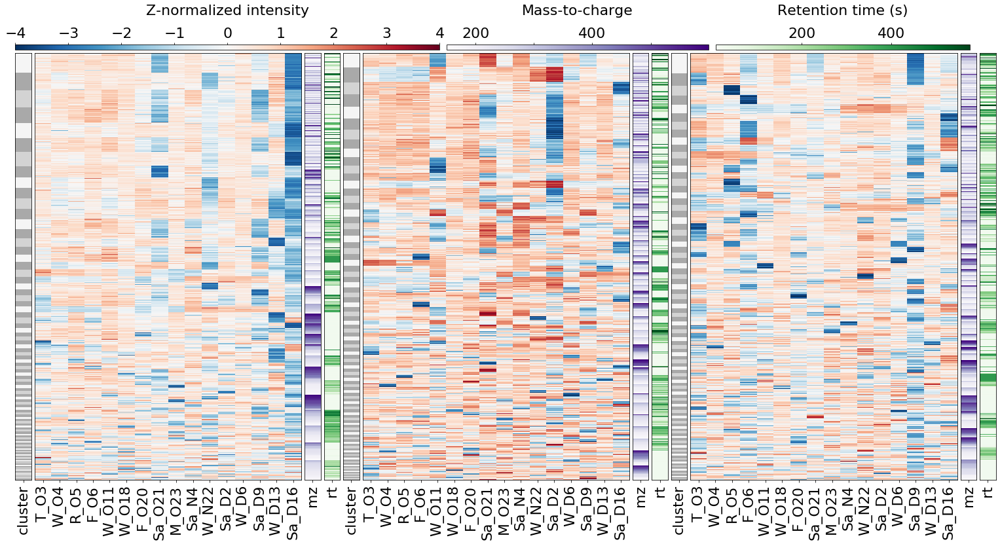

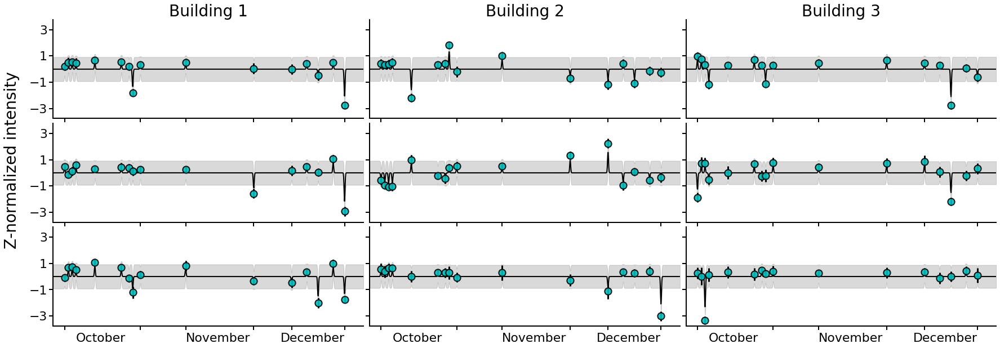

In [17]:
##### PLOT for figure 3 in the paper
### for making the large paper plots of metabolite features + cluster + mz + rt + 5 largest clusters 
def plot_time_series(ax, date_sorted_order_by_cluster, clusters_for_plotting, i):
    x_ = [1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75]
    x_ = np.array(x_)[:,np.newaxis]
    y = date_sorted_order_by_cluster.iloc[:,clusters_for_plotting[i][0]:clusters_for_plotting[i][1]].values.T.mean(axis=0)
    noise = date_sorted_order_by_cluster.iloc[:,clusters_for_plotting[i][0]:clusters_for_plotting[i][1]].values.T.std(axis=0).mean()
    kernel =  1* RBF(length_scale=0.125) + 1*WhiteKernel(noise_level=noise) #, noise_level_bounds=(1e-10, 1e+1))
    gp = GaussianProcessRegressor(kernel=kernel, alpha=0.0001).fit(x_, y)
    X_ = np.linspace(-2, 80,1000)
    y_mean, y_cov = gp.predict(X_[:, np.newaxis], return_cov=True)
    ax.plot(X_, y_mean, 'k', lw=2, zorder=9)
    ax.fill_between(X_, y_mean - np.sqrt(np.diag(y_cov)),
                     y_mean + np.sqrt(np.diag(y_cov)),
                     alpha=0.15, color='k')
    ax.scatter(x_[:, 0], y, c='c', alpha=0.9, s=150, zorder=10, edgecolors=(0, 0, 0), linewidths=2)
    err = date_sorted_order_by_cluster.iloc[:,clusters_for_plotting[i][0]:clusters_for_plotting[i][1]].values.T.std(axis=0)
    ax.errorbar(x_[:,0], y, yerr=err, fmt='none', c='k',elinewidth=3)    
    ax.set_xticks([1,21,33,51,61,75])
    ax.set_xticklabels([])
    ax.set_xlim([-2,80])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.tick_params(length=7, width=2)
    
def make_multi_time_series(date_sorted_order_by_clusters, data_mats):
    fig = plt.figure(figsize=(30,10))
    plt.rcParams.update({'font.family' : 'sans-serif','font.size': 22})
    gs = GridSpec(3,3, figure=fig,wspace=0.02,hspace=0.05)    
    
    for i, sorted_cluster_sizes, data_mat in zip([0,1,2],date_sorted_order_by_clusters, data_mats):
        clusters_for_plotting = cluster_sizes_for_plotting(sorted_cluster_sizes)
        ax1 = fig.add_subplot(gs[0:1,i:i+1])
        ax2 = fig.add_subplot(gs[1:2,i:i+1])
        ax3 = fig.add_subplot(gs[2:3,i:i+1])
        for j, ax in enumerate([ax1,ax2,ax3]):
            if j == 0 and i == 0:
                ax.set_title('Building 1', fontsize=28)
            elif j == 0 and i == 1:
                ax.set_title('Building 2', fontsize=28)
            elif j == 0 and i == 2:
                ax.set_title('Building 3', fontsize=28)
                
            for axis in ['bottom','left']:
                ax.spines[axis].set_linewidth(2)
#             ax.yaxis.tick_right()
            plot_time_series(ax, data_mat.T, clusters_for_plotting,j)
            ax.set_ylim([-3.75,3.75])
            ax.set_yticks([-3,-1,1,3])
            if i == 0 and ax == ax2:
                ax.text(-15,-5.5,'Z-normalized intensity', rotation=90, fontsize=28)
            if i != 0:
                ax.set_yticklabels([])
            if ax == ax3:
                ax.text(4,-4.95,'October')
                ax.text(33,-4.95,'November')
                ax.text(58,-4.95,'December')
    plt.savefig('Fig3b_new.svg', format='svg', dpi=1000, bbox_inches='tight')


def make_multiplot_with_means(kmean_objs, data_mats, sorted_cluster_sizes_, peaks_data_og_with_metabs):
    fig = plt.figure(figsize=(30,12))
    plt.rcParams.update({'font.family' : 'sans-serif','font.size': 22})
    gs = GridSpec(24,57, figure=fig)
    for kmeans_obj, data_mat, sorted_cluster_sizes, peaks_data_og_with_metab, i in zip(kmean_objs, data_mats, sorted_cluster_sizes_, peaks_data_og_with_metabs, [0,1,2]):
        if i == 0:
            j = 0
        elif i == 1:
            j = 17
        else:
            j = 34
        ax1 = fig.add_subplot(gs[:, j:j+1])
        ax2 = fig.add_subplot(gs[:, j+1:j+15])
        ax3 = fig.add_subplot(gs[:, j+15:j+16])
        ax4 = fig.add_subplot(gs[:, j+16:j+17])
        if i == 0:
            colors = ['darkgray','lightgray','darkgrey','whitesmoke']*len(sorted_cluster_sizes)
        elif i == 1:
            colors = ['darkgray','lightgray','darkgrey','whitesmoke']*len(sorted_cluster_sizes)
        else:
            colors = ['darkgray','lightgray','darkgrey','whitesmoke']*len(sorted_cluster_sizes)
        running_base = 0
        cluster_positions = []
        for c_size, c in zip(sorted_cluster_sizes[::-1], colors):
            ax1.bar([0], c_size[1], bottom=running_base, width=0.25, color=c)
            running_base += c_size[1]
            cluster_positions.append(running_base)
        cluster_max = cluster_positions[-1]-1
        cluster_positions_new = cluster_positions[::-1][1:]
        cluster_positions_new = [cluster_max - ele for ele in cluster_positions_new]
        ax1.set_xticks([0.0625])
        ax1.set_xticklabels(['cluster'], rotation=90)
        ax1.set_yticks([])
        ax1.set_ylim([0,running_base])
        ax1.set_xlim([0,.125])

        mat = ax2.imshow(data_mat, aspect='auto', cmap='RdBu_r')
        ax2.set_xticks([i for i in range(16)])
        labs = list(data_mat.T.index)
        labs = [ele.split('B')[0] for ele in labs]
        ax2.set_xticklabels(labs, rotation=90) 
        ax2.set_yticks([])

        mzs = ax3.imshow(peaks_data_og_with_metab[['mz']], aspect='auto', cmap='Purples')
        ax3.set_xticks([0])
        ax3.set_xticklabels(['mz'], rotation=90)
        ax3.set_yticks([])
        ax3.set_ylim([0,running_base])

        rts = ax4.imshow(peaks_data_og_with_metab[['rt']], aspect='auto', cmap='Greens')
        ax4.set_xticks([0])
        ax4.set_xticklabels(['rt'], rotation=90)
        ax4.set_yticks([])
        ax4.set_ylim([0,running_base])
        if i == 0 :
            cbaxes = fig.add_axes([0.125, 0.885, 0.3, 0.01]) 
            cbar1 = plt.colorbar(mat, ax=ax2, cax = cbaxes, orientation='horizontal')  
            mat.set_clim(-4,4)
            cbar1.ax.xaxis.tick_top()
            cbar1.ax.set_xlabel('Z-normalized intensity', labelpad=-70)
            cbaxes2 = fig.add_axes([0.43, 0.885, 0.185, 0.01]) 
            cbar2 = plt.colorbar(mzs, ax=ax3, cax = cbaxes2, orientation='horizontal')  
            cbar2.ax.xaxis.tick_top()
            cbar2.ax.set_xticklabels(['200','','400','','600','','800'])
            cbar2.ax.set_xlabel('Mass-to-charge', labelpad=-70)
            cbaxes3 = fig.add_axes([0.62, 0.885, 0.18, 0.01]) 
            cbar3 = plt.colorbar(rts, ax=ax3, cax = cbaxes3, orientation='horizontal')  
            cbar3.ax.xaxis.tick_top()
            cbar3.ax.set_xlabel('Retention time (s)', labelpad=-70)
    plt.savefig('Fig3a_new.svg', format='svg', dpi=1000, bbox_inches='tight')

#### plot it all together
kmeans_ = [kmeans_7, kmeans_61,kmeans_84]
data_mat = [z_norm_com_day_b_7.T.loc[new_order_7], z_norm_com_day_b_61.T.loc[new_order_61], z_norm_com_day_b_84.T.loc[new_order_84]]
c_sizes = [sorted_cluster_sizes_7, sorted_cluster_sizes_61, sorted_cluster_sizes_84]
peak_info = [peaks_data_og_with_metab.loc[new_order_7], peaks_data_og_with_metab.loc[new_order_61], peaks_data_og_with_metab.loc[new_order_84]]

make_multiplot_with_means(kmeans_, data_mat, c_sizes, peak_info)
make_multi_time_series(c_sizes, data_mat)

In [188]:
### look at cluster metab class representation 
## databases for looking up metab class
db_path = '/home/ubuntu/data/mz_to_metab_mapping/'
dbs_name = {'chebi':'chebi_metabolites.pkl','hmdb':'hmdb_metabolites.pkl',
       'lipidmap':'lipidmap_metabolites.pkl','metacyc':'metacyc_metabolites.pkl'}
dbs = {'chebi':None,'hmdb':None,'lipidmap':None,'metacyc':None, 
       'lipid_msms':None, 'hmdb_msms':None, 'kegg_msms':None}
for db in dbs_name:
    db_ = pickle.load(open(os.path.join(db_path,dbs_name[db]), 'rb'))
    db_lc = {k.lower():v for k,v in db_.items() if type(k)==str}
    dbs[db] = db_lc

inchi_lookups = {'hmdb':None, 'lipidmap':None}
for ele in ['hmdb', 'lipidmap']:
    db = dbs[ele]
    new_db = {}
    for ent in db:
        new_db[db[ent]['inchikey']] = db[ent]
    inchi_lookups[ele] = new_db
    
extra_db_path = '/home/ubuntu/data/mz_to_metab_mapping/msms_pipeline_analysis/essentials/'
csv_dbs = ['lipidmaps.csv','kegg_2017-07-23.csv']
for db_name, csv in zip(['lipid_msms','kegg_msms'], csv_dbs): 
    msms_db = open(os.path.join(extra_db_path, csv), 'r')
    new_db = {}
    for line in msms_db:
        line = line.strip().split('","')
        if db_name == 'lipid_msms':
            new_db[line[0][1:].lower()] = {'mass':line[1],'formula':line[3],'class':line[5], 'sub_class':line[6],
                                           'inchi':line[8][6:], 'inchikey':'-'.join([line[9],line[10],line[12]])}
    dbs[db_name] = new_db


In [189]:
def accession_to_name(dbs):
    acc_to_name = {}
    for ele in dbs['hmdb']:
        for acc in dbs['hmdb'][ele]['hmdb_accession']:
            acc_to_name[acc] = ele
    return acc_to_name

def inchikey_to_name(dbs):
    inchi_to_name = {}
    for ele in dbs['hmdb']:
        inchikey = dbs['hmdb'][ele]['inchikey']
        inchi_to_name[inchikey] = ele
    return inchi_to_name

def inchi_to_name(dbs):
    inchi_to_name = {}
    for ele in dbs['hmdb']:
        inchi = dbs['hmdb'][ele]['inchi']
        inchi_to_name[inchi] = ele
    return inchi_to_name

### get the accessions matching to HMDB names:
acc_to_name_hmdb = accession_to_name(dbs)
### get the inchikey to name for HMDB:
inchikey_to_name_hmdb = inchikey_to_name(dbs)
### get the inchi to name for HMDB:
inchi_to_name_hmdb = inchi_to_name(dbs)

In [216]:
## class / sub_class / type analysis for stable and nonstable
## idea: take the labels, look up the compound in df, take the name and look into the DBs
def get_names(inds, name_df):
    names = list(name_df.loc[inds,'metfrag_matched_best_guess'].values)
    names_w_inds = [[n,i] for n,i in zip(names,inds)]
    total = len(names_w_inds)
    names_w_inds = [ele for ele in names_w_inds if 'Da/' not in ele[0]]
    num_remaining = len(names)
    removed = total - num_remaining
    names = [ast.literal_eval(ele[0]) for ele in names_w_inds]
    inds = [ele[1] for ele in names_w_inds]
    new_names = []
    new_inds = []
    for group,ind in zip(names,inds):
        new_group = []
        for chem in group:
            if len(chem) == 4 and 'C13' in chem[2]:
                continue
            if '**' in chem[0]:
                new_group.append(chem[0][:-2].lower())
            else:
                new_group.append(chem[0].lower())
        if len(new_group) == 0:
            num_remaining -= 1
            removed += 1
        else:
            new_names.append(new_group)
            new_inds.append(ind)
    return new_names, new_inds

def db_name_look_up(name, dbs):
    ### lipidmaps category = hmdb class
    ### lipidmaps main class = hmdb subclass
    ### lipidmaps sub class = hmdb direct parent
    db_info = []
    for db in ['hmdb','lipidmap', 'lipid_msms', 'chebi', 'metacyc']:
        db_info_ = []                
        try:
            chem = dbs[db][name]
            if db == 'hmdb':
                cats = ['class', 'sub_class', 'direct_parent']
            else:
                if chem['hmdb'] != None:
                    try:
                        if type(chem['hmdb']) == list:
                            for acc in chem['hmdb']:
                                try:
                                    hmdb_name = acc_to_name_hmdb[acc]
                                    chem = dbs['hmdb'][hmdb_name]
                                    cats = ['class', 'sub_class', 'direct_parent']
                                    break
                                except:
                                    pass
                        else:
                            hmdb_name = acc_to_name_hmdb[chem['hmdb']]
                            chem = dbs['hmdb'][hmdb_name]
                            cats = ['class', 'sub_class', 'direct_parent']
                    except:
                        try:
                            hmdb_name = inchikey_to_name_hmdb[chem['inchikey']]
                            chem = dbs['hmdb'][hmdb_name]
                            cats = ['class', 'sub_class', 'direct_parent']
                        except:
                            try:
                                hmdb_name = inchi_to_name_hmdb[chem['inchi']]
                                chem = dbs['hmdb'][hmdb_name]
                                cats = ['class', 'sub_class', 'direct_parent']
                            except:
                                cats = ['category','class','sub_class','super_class','inchikey','inchi']
                else:
                    try:
                        hmdb_name = inchikey_to_name_hmdb[chem['inchikey']]
                        chem = dbs['hmdb'][hmdb_name]
                        cats = ['class', 'sub_class', 'direct_parent']
                    except:
                        try:
                            hmdb_name = inchi_to_name_hmdb[chem['inchi']]
                            chem = dbs['hmdb'][hmdb_name]
                            cats = ['class', 'sub_class', 'direct_parent']
                        except:
                            cats = ['category','class','sub_class','super_class','inchikey','inchi']
            for ele in cats:
                try:
                    if type(chem[ele]) == list:
                        db_info_.append(chem[ele][0])
                    else:
                        db_info_.append(chem[ele])
                except:
                    db_info_.append(None)
            if len(db_info_) > 3:
                db_info_ = []
                try:
                    db_info_.append(chem['category'])
                    db_info_.append(chem['class'])
                    db_info_.append(chem['sub_class'])
                except:
                    db_info_.append(None)
            if set(db_info_) == set([None]):
                continue
            if db_info_ not in db_info:
                db_info.append(db_info_)
                break
        except:
            pass
    return db_info

def names_lookup(names_list, dbs):
    name_to_groups = {}
    for i, group in enumerate(names_list):
        group_info = []
        for chem in group:
            db_info = db_name_look_up(chem, dbs)
            if len(db_info) == 0:
                continue
            elif db_info[0] in group_info:
                continue
            else:
                group_info += db_info
        name_to_groups[i] = group_info
    return name_to_groups

def make_hist(list_of_names):
    h = {}
    for ele in list_of_names:
        if ele not in h:
            h[ele] = 1
        else:
            h[ele] += 1
    return h

def get_best_name(names, priority='middle'):
    l1 = names[0]
    l2 = names[1]
    l3 = names[2]
    if priority == 'last':
        if l3 == None:
            if l2 == None:
                return l1
            else:
                return l2
        return l3
    elif priority == 'middle':
        if l2 == None:
            return l1
        else:
            return l2
    elif priority == 'first':
        return l1

def chart_metab_classes(class_to_count, title, priority):
    heights = list(class_to_count.values())
    labels = list(class_to_count.keys())
    fig = plt.figure(figsize=(5,5))
    ax = plt.subplot()
    y = [i for i in range(len(labels))]
    ax.barh(y, heights,color='c', edgecolor='k', linewidth=0.5)
    ax.set_yticks(y)
    ax.set_yticklabels(labels)
    ax.set_ylim([-0.5,len(labels)-0.5])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_xlabel('Class counts', fontname='sans-serif', fontsize=12)
    ax.set_title(title+' '+priority, fontname='sans-serif', fontsize=14)
        
#     if save:
    plt.savefig('metab_types_{}_{}.svg'.format('_'.join(title.split(' ')),'_'.join(priority.split(' '))), format='svg', dpi=1000, bbox_inches='tight')
    plt.show()

def get_max_classes(class_dict, x):
    list_d = sorted([(k,v) for k,v in class_dict.items()],key=lambda x:x[1], reverse=True)
    top_dict = {kv[0]:kv[1] for kv in list_d[:x]}
    return top_dict

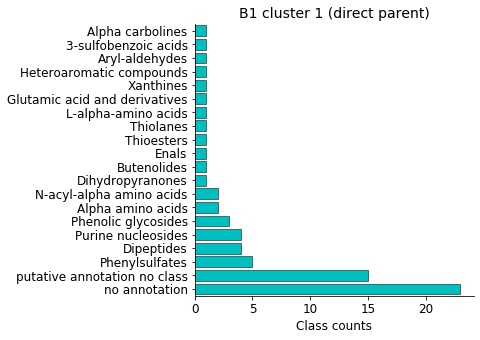

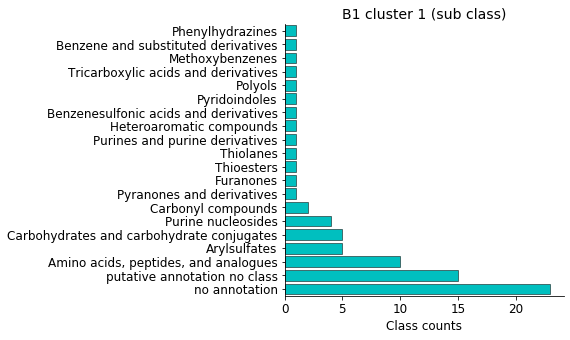

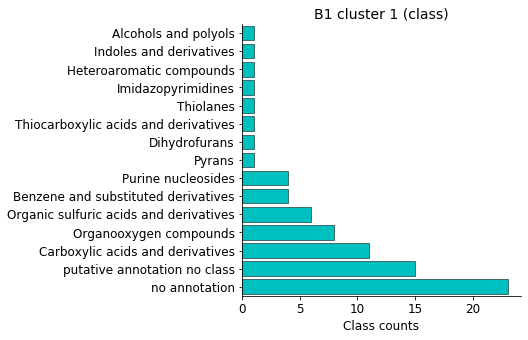

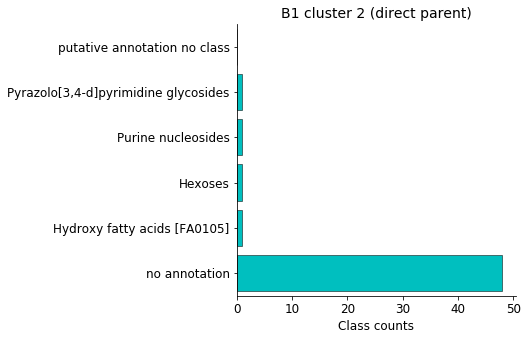

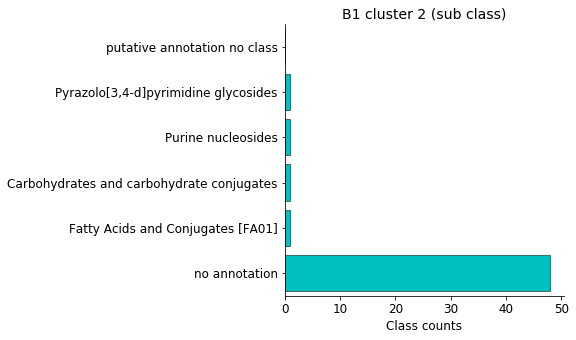

...

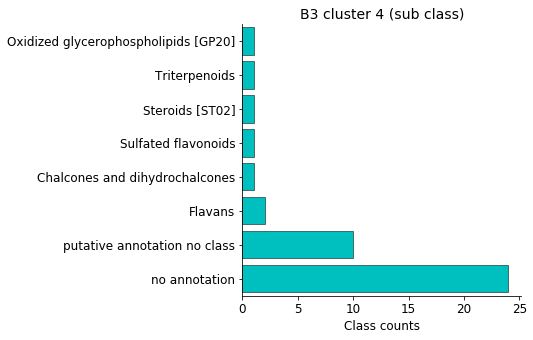

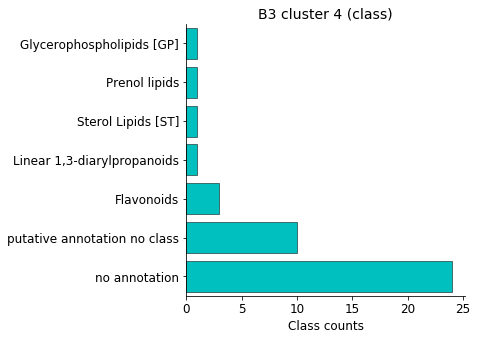

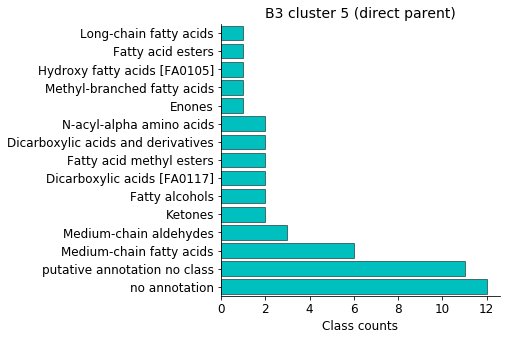

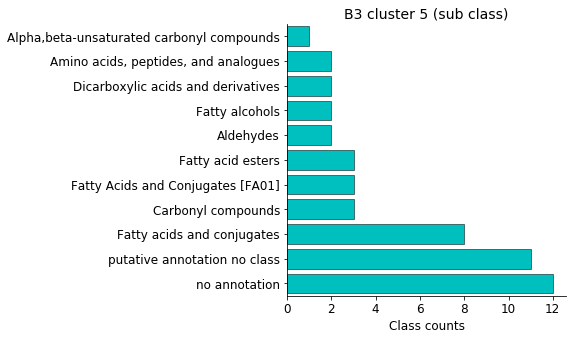

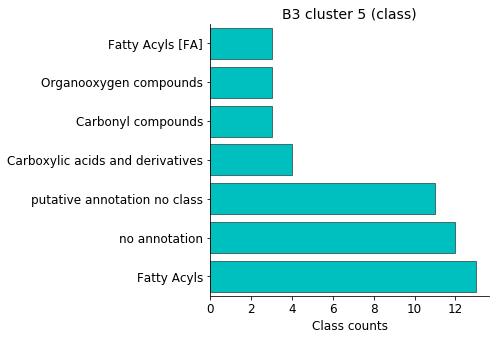

In [217]:
## looking at top 5 clusters in each buildings for the 3 class types....
## get the features from the reordered 'peak_info' list B1,B2,B3 and associated c_sizes
num_clust_to_plot = 5
for b, sorted_cluster_sizes, building_feats in zip(['B1','B2','B3'],c_sizes,peak_info):
    clusters_for_plotting = cluster_sizes_for_plotting(sorted_cluster_sizes)
    for j in range(num_clust_to_plot):
        c_name = 'cluster {}'.format(j+1)
        ind_s_f = clusters_for_plotting[j]
        b_cluster_j_feat = building_feats.iloc[ind_s_f[0]:ind_s_f[1],:]
        b_cluster_j_feat_metfrag = building_feats.iloc[ind_s_f[0]:ind_s_f[1],14]
        b_clust_j_inds = list(b_cluster_j_feat.index)
        title = b + ' ' + c_name
        all_comp = list(peaks_data_og_with_metab.loc[b_clust_j_inds,'metfrag_matched_best_guess'].values)
        not_annot = [ele for ele in all_comp if 'Da/' in ele]
        names_met_c,s_inds_met_c = get_names(b_clust_j_inds, peaks_data_og_with_metab)
        named_groups_met_c = names_lookup(names_met_c, dbs)
        for pri,pri_class in zip(['last', 'middle', 'first'],['(direct parent)', '(sub class)', '(class)']):
            all_groups = {'no annotation':len(not_annot), 'putative annotation no class':0}
            for k, metab_groups in named_groups_met_c.items():
                if 'Da/' not in all_comp[k]:
                    all_put_comps = ast.literal_eval(all_comp[k])
                    if (len(all_put_comps) != 0 and len(metab_groups) == 0):
                        all_groups['putative annotation no class']+= int(len(all_put_comps)-len(metab_groups))
                for sub_g in metab_groups:
                    sub_g_class = get_best_name(sub_g, priority=pri)
                    if sub_g_class not in all_groups:
                        all_groups[sub_g_class] = 1
                    else:
                        all_groups[sub_g_class] += 1  
            all_groups = get_max_classes(all_groups,20)
            chart_metab_classes(all_groups, title, pri_class)       

/home/ubuntu/data/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning
/home/ubuntu/data/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning
/home/ubuntu/data/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning
/home/ubuntu/data/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning
/home/ubuntu/data/anaconda3/lib/

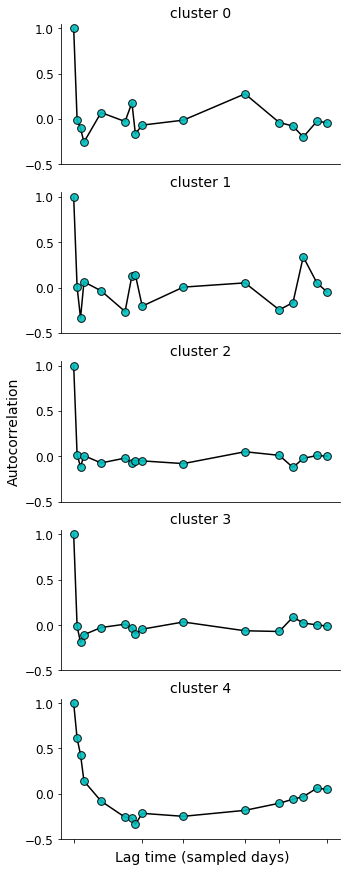

In [20]:
##### plot autocorrelations of the top 5 clusters 
plt.rcParams.update({'font.family' : 'sans-serif','font.size': 12})
def plot_auto_series(ax, date_sorted_order_by_cluster, clusters_for_plotting, i):
    x_ = [1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75]
    x_ = np.array(x_)[:,np.newaxis]
    y = date_sorted_order_by_cluster.iloc[:,clusters_for_plotting[i][0]:clusters_for_plotting[i][1]].values.T.mean(axis=0)
    y = acf(y)
    ax.scatter(x_[:, 0], y, c='c', alpha=0.9, s=60, zorder=10, edgecolors=(0, 0, 0))
    ax.plot(x_[:,0], y, 'k')
    ax.set_xticks([1,21,33,51,61,75])
#     ax.set_xticks(x_)
    ax.set_xticklabels([])

from statsmodels.graphics import tsaplots
from statsmodels.tsa.stattools import acf 

fig = plt.figure(figsize=(5,15))
gs = GridSpec(5,1, figure=fig)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax3 = fig.add_subplot(gs[2])
ax4 = fig.add_subplot(gs[3])
ax5 = fig.add_subplot(gs[4])

building = 84
if building == 7:
    data_mat = z_norm_com_day_b_7.T.loc[new_order_7]
    sorted_cluster_sizes = sorted_cluster_sizes_7
elif building == 61:
    data_mat = z_norm_com_day_b_61.T.loc[new_order_61]
    sorted_cluster_sizes = sorted_cluster_sizes_61
else:
    data_mat = z_norm_com_day_b_84.T.loc[new_order_84]
    sorted_cluster_sizes = sorted_cluster_sizes_84
    
clusters_for_plotting = cluster_sizes_for_plotting(sorted_cluster_sizes)

for i, ax in enumerate([ax1,ax2,ax3,ax4,ax5]):
    plot_auto_series(ax, data_mat.T, clusters_for_plotting,i)
    ax.set_ylim([-.5,1.05])
    ax.set_title('cluster {}'.format(i), fontsize=14)
#     ax.set_yticks([-1,-0.5,0,0.5,1])
    if ax != ax5:
        ax.set_xticks([])
    if ax == ax3:
        ax.set_ylabel('Autocorrelation', rotation=90, fontsize=14)
    if ax == ax5:
        ax.text(13,-0.75, 'Lag time (sampled days)', fontsize=14,fontname='sans-serif')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(12)
        tick.label.set_fontname('sans-serif')
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(12)
        tick.label.set_fontname('sans-serif')
plt.savefig('autocorr_b_{}_new.svg'.format(building), format='svg', dpi=1000, bbox_inches='tight')


105836.0
39155.0
30930.0
15079.0
8984.0
5546.0


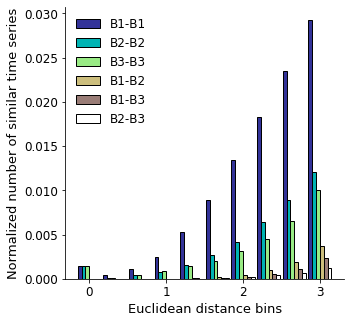

In [21]:
#### looking at the overall distances between all-to-all comparisions either inside or between studies
# plt.rcParams.update({'font.family' : 'sans-serif','font.size': 12})
def calc_distance_internal(m1,m2):
    dist = distance_matrix(m1.values.T,m2.values.T)
    return dist

b7_b7_dist = calc_distance_internal(z_norm_com_day_b_7, z_norm_com_day_b_7)
b61_b61_dist = calc_distance_internal(z_norm_com_day_b_61, z_norm_com_day_b_61)
b84_b84_dist = calc_distance_internal(z_norm_com_day_b_84, z_norm_com_day_b_84)
b7_b61_dist = calc_distance_internal(z_norm_com_day_b_7, z_norm_com_day_b_61)
b7_b84_dist = calc_distance_internal(z_norm_com_day_b_7, z_norm_com_day_b_84)
b61_b84_dist = calc_distance_internal(z_norm_com_day_b_61, z_norm_com_day_b_84)
combined = []
comparisons = []
sizes_comparison = []
for b in [b7_b7_dist, b61_b61_dist,b84_b84_dist,b7_b61_dist,b7_b84_dist,b61_b84_dist]:
    try:
        b = squareform(b)
        b = np.concatenate((b,np.asarray([0 for i in range(b7_b7_dist.shape[0])])))
    except:
        b = b.flatten()
    sizes_comparison.append(b.size)
    comparisons.append(b.shape[0])
    b=b[b<2.82]
    combined.append(b)
    
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))
ax.boxplot(combined)
n, _, _ = ax.hist(combined)
plt.cla()
new_hist = []
offsets = [-.125,-0.075,-.025,.025,.075,.125]
cmap=plt.get_cmap('terrain')
colors = [cmap(float(i/5)) for i in range(6)]
for series,comp_size, comparison,offset,c in zip(n,sizes_comparison, comparisons, offsets,colors):
    print(series.sum())
#     series /= comparison
    plt.bar([i/3+offset for i in range(series.shape[0])], series/comp_size, width=0.05, color=c, edgecolor='k')
plt.legend(['B1-B1', 'B2-B2', 'B3-B3', 'B1-B2', 'B1-B3', 'B2-B3'], frameon=False, fontsize=12)
ax.set_ylabel('Normalized number of similar time series',fontname='sans-serif', fontsize=13)
ax.set_xlabel('Euclidean distance bins',fontname='sans-serif', fontsize=13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
for label in (ax.get_yticklabels()):
    label.set_fontsize(12)
    label.set_fontname('sans-serif')
for label in (ax.get_xticklabels()):
    label.set_fontsize(12)
    label.set_fontname('sans-serif')
plt.savefig('Fig5_b_new.svg', format='svg', dpi=1000, bbox_inches='tight')
plt.show()

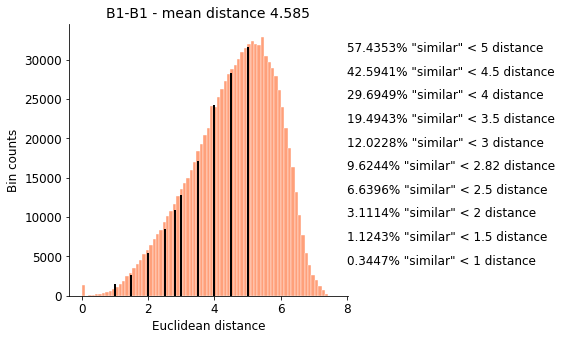

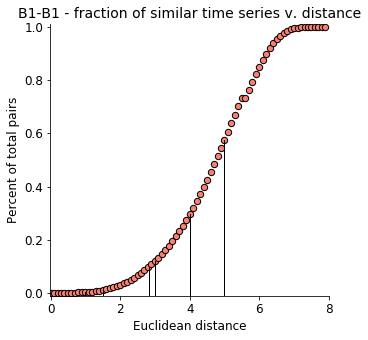

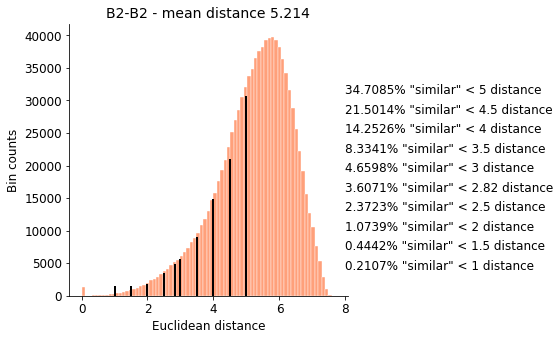

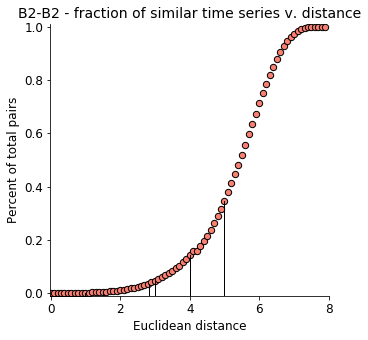

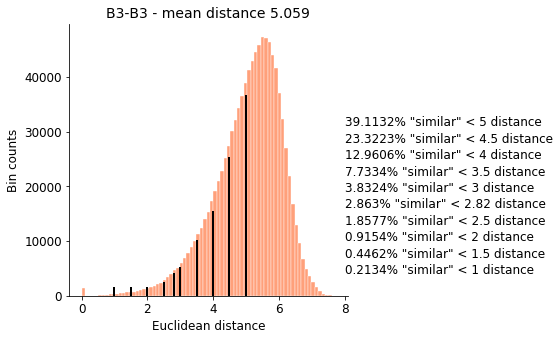

...

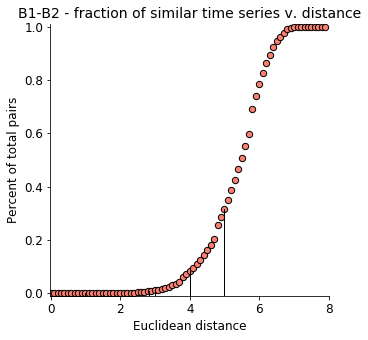

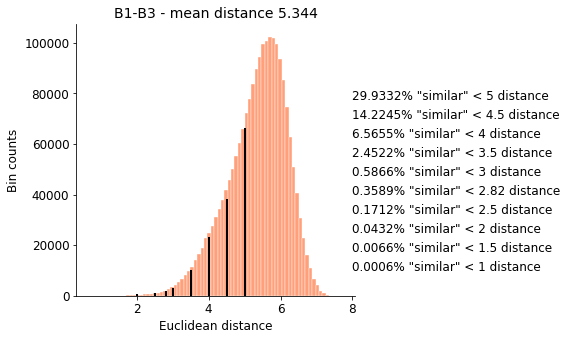

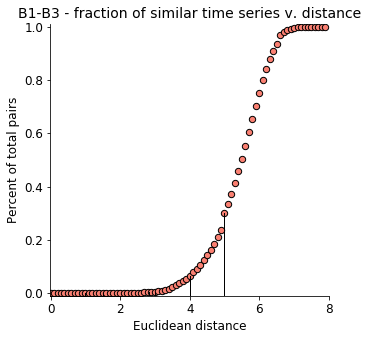

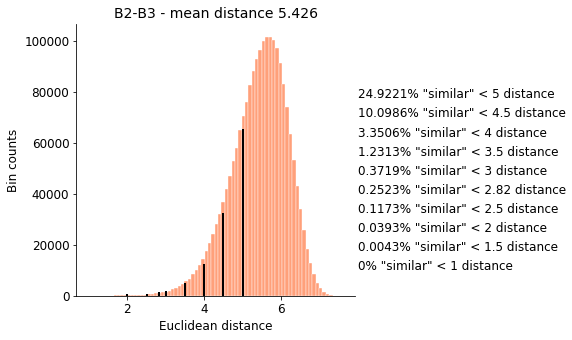

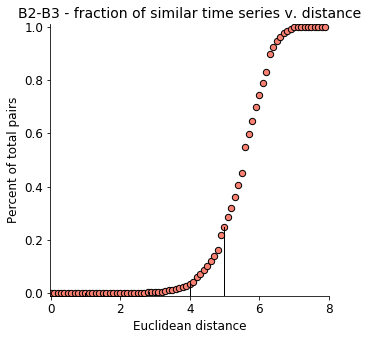

In [22]:
plt.rcParams.update({'font.family' : 'sans-serif','font.size': 12})
### looking at the distribution of all distances for each comparison:
titles = ['B1-B1', 'B2-B2','B3-B3','B1-B2','B1-B3','B2-B3']
for b,boost,title in zip([b7_b7_dist, b61_b61_dist,b84_b84_dist,b7_b61_dist,b7_b84_dist, b61_b84_dist],[1,1,1,2.5,2.5,2.5], titles):
    try:
        b = squareform(b)
        b = np.concatenate((b,np.asarray([0 for i in range(b7_b7_dist.shape[0])])))
    except:
        b = b.flatten()
    mean = b.mean()
    fig = plt.figure(figsize=(5,5))
    ax = plt.subplot()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
#     ylabels = [0,1000,2000,3000,4000]
#     ax1.yaxis.set_ticks(tick_loc)
#     ax1.set_yticklabels(titles,  fontname='sans-serif', fontsize=12)
    n,bins, _ = plt.hist(b, bins=75,facecolor='lightsalmon', edgecolor='white', linewidth=0.4)
    sum_at_threshs_ = []
    max_at_threshs = []
    thresholds = [1,1.5,2,2.5,2.82,3,3.5,4,4.5,5] 
    for thresh in thresholds:
        mask = bins<thresh
        try:
            n_mask = n[mask[1:]]
            max_at_threshs.append(n_mask.max())
            sum_at_threshs_.append(n_mask.sum()/n.sum())
        except:
            max_at_threshs.append(0)
            sum_at_threshs_.append(0)
    
    for thresh,h in zip(thresholds, max_at_threshs):
        ax.plot([thresh,thresh],[0,h],'k-', linewidth=2.0)

      
    xs = [8,8,8,8,8,8,8,8,8,8]  
    ys = [4000,7000,10000,13000,16000,19000,22000,25000,28000,31000]
    for x, y, val, thresh in zip(xs, ys, sum_at_threshs_, thresholds):
        ax.text(x,y*boost,'{}% "similar" < {} distance'.format(round(100*val,4),thresh),fontname='sans-serif')
    ax.set_xlabel('Euclidean distance',fontname='sans-serif', fontsize=12)
    ax.set_ylabel('Bin counts',fontname='sans-serif', fontsize=12)
    ax.set_title(title+' - mean distance {:.3f}'.format(mean),fontname='sans-serif', fontsize=14)    
    plt.savefig('distance_histogram_{}.svg'.format(title), format='svg', dpi=1000, bbox_inches='tight')
    plt.show()
    ####### 
    distances = np.arange(0,8,0.1)
    sum_at_threshs = []
    max_at_threshs = []    
    for thresh in distances:
        mask = bins<thresh
        try:
            n_mask = n[mask[1:]]
            max_at_threshs.append(n_mask.max())
            sum_at_threshs.append(n_mask.sum()/n.sum())
        except:
            max_at_threshs.append(0)
            sum_at_threshs.append(0)
    fig = plt.figure(figsize=(5,5))
    ax = plt.subplot()
    ax.set_xlim([-0.01,8.01])
    ax.set_ylim([-0.01,1.01])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_xlabel('Euclidean distance',fontname='sans-serif', fontsize=12)
    ax.set_ylabel('Percent of total pairs',fontname='sans-serif', fontsize=12)
    ax.set_title(title+' - fraction of similar time series v. distance'.format(mean),fontname='sans-serif', fontsize=14)    
    ax.scatter(distances,sum_at_threshs, c='salmon',edgecolor='k', s=40)
    ts = [1,1.5,2.82,3,4,5] 
    for t,h in zip(ts,[0,1,4,5,7,9]):
        ax.plot([t,t],[-0.01,sum_at_threshs_[h]],'k-', linewidth=1.0)
    plt.savefig('fraction_v_distance_{}.svg'.format(title), format='svg', dpi=1000, bbox_inches='tight')


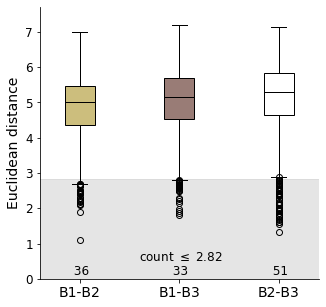

In [23]:
def calc_distance(m1,m2):
    '''
    this just does a feature to feature distance, no all possible combos
    '''
    dist = []
    for col in m1.columns:
        c1 = m1[col]
        c2 = m2[col]
        dist.append((euclidean(c1,c2),col))
    dist = sorted(dist, key=lambda x: x[0])
    return dist

b7_b61_dist = calc_distance(z_norm_com_day_b_7, z_norm_com_day_b_61)
b7_b84_dist = calc_distance(z_norm_com_day_b_7, z_norm_com_day_b_84)
b61_b84_dist = calc_distance(z_norm_com_day_b_61, z_norm_com_day_b_84)
b7_b61_dist_np = np.asarray(b7_b61_dist)[:,0]
b7_b84_dist_np = np.asarray(b7_b84_dist)[:,0]
b61_b84_dist_np = np.asarray(b61_b84_dist)[:,0]

lt_count = []
for b in [b7_b61_dist_np,b7_b84_dist_np,b61_b84_dist_np]:
    c = 0
    for e in b:
        if e <= 2.82:
            c+=1
    lt_count.append(c)
combined = np.concatenate((b7_b61_dist_np,b7_b84_dist_np,b61_b84_dist_np), axis=0).reshape((-1,1425))

cmap=plt.get_cmap('terrain')
colors = [cmap(float(i/5)) for i in range(6)]
colors = colors[-3:]

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))
# ax.violinplot(combined.T, showmeans=True, showextrema=True)
bx = ax.boxplot(combined.T,patch_artist=True)
for i,patch in enumerate(bx['boxes']):
    patch.set(facecolor=colors[i])
for element in ['medians']:
    plt.setp(bx[element], color='k')
ax.set_xticks([1,2,3])
ax.set_xticklabels(['B1-B2', 'B1-B3', 'B2-B3'])
ax.set_ylabel('Euclidean distance',fontname='sans-serif', fontsize=14)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
for label in (ax.get_yticklabels()):
    label.set_fontsize(12)
    label.set_fontname('sans-serif')
for label in (ax.get_xticklabels()):
    label.set_fontsize(14)
    label.set_fontname('sans-serif')
for i,ele in enumerate(lt_count):
    ax.text(i+.9,0.1,' {}'.format(ele),fontname='sans-serif', fontsize=12)
ax.text(1.6,0.5,r'count $\leq$ 2.82',fontname='sans-serif', fontsize=12)
plt.xlim([0.6,3.4])
plt.ylim([0,7.7])
plt.fill_between([0,4],[2.82,2.82], color='gray', alpha=0.2)
plt.savefig('Fig5_d_new.svg', format='svg', dpi=1000, bbox_inches='tight')
plt.show()

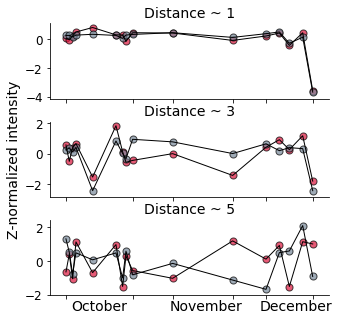

In [244]:
#### making examples plots for 1,3,5 distances
def find_distance_traces(m1,m2):
    traces = {1:[], 3:[], 5:[]}
    need = [1,1,1,3,3,3,5,5,5]
    for col in m1.columns:
        c1 = m1[col]
        for c in m2.columns:
            c2 = m2[c]
            res = euclidean(c1,c2)
            if 0.9 < res < 1.1:
                traces[1].append([c1,c2])
                try:
                    need.remove(1)
                except:
                    pass
            elif 2.9 < res < 3.1:
                traces[3].append([c1,c2])
                try:
                    need.remove(3)
                except:
                    pass
            elif 4.9 < res < 5.1:
                traces[5].append([c1,c2])
                try:
                    need.remove(5)
                except:
                    pass
            if len(need) == 0:
                return traces
    return traces

distance_traces = find_distance_traces(z_norm_com_day_b_7, z_norm_com_day_b_84)
colors = ['crimson', 'lightslategray']
fig = plt.figure(figsize=(5, 5))
gs = GridSpec(3,1, figure=fig, hspace=0.3)
for i, dist in enumerate(distance_traces):
    ax = plt.subplot(gs[i])
    for trace, c in zip(distance_traces[dist][0],colors):
        ax.scatter([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75], trace, c=c,s=50, alpha=0.7, edgecolor='k')
        ax.plot([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75], trace, 'k', linewidth=1)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_xticks([1,21,33,51,61,75])
    ax.set_xticklabels([])
    for label in (ax.get_yticklabels()):
        label.set_fontsize(12)
        label.set_fontname('sans-serif')
    ax.set_title('Distance ~ {}'.format(dist),fontname='sans-serif', fontsize=14)
    if i == 1:
        ax.set_ylabel('Z-normalized intensity',fontname='sans-serif', fontsize=14)
    if i == 2:
        ax.text(2.5,-2.9,'October',fontname='sans-serif', fontsize=14)
        ax.text(32,-2.9,'November', fontname='sans-serif', fontsize=14)
        ax.text(59,-2.9,'December', fontname='sans-serif', fontsize=14)
plt.savefig('Fig5_a_new.svg', format='svg', dpi=1000, bbox_inches='tight')
plt.show()

In [139]:
#### set the distance cutoff for what is similar
dist_cut = 1.5

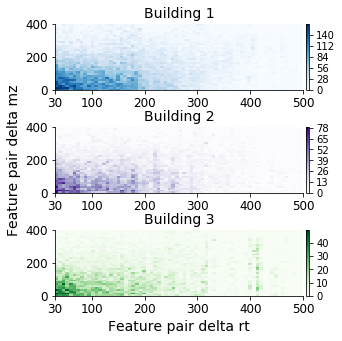

In [140]:
##### here is the peaks data for everything: peaks_data_cv_filt ##### 
##### actually just looking at building 7

def get_delta_mz_rt(z_norm_data, dist_mat, d):
    recol_z_norm_data = z_norm_data.copy()
    recol_z_norm_data.columns = [i for i in range(recol_z_norm_data.shape[1])]
    remap_col_name = {i:name for i, name in enumerate(z_norm_data.columns)}
    close_indicies = np.argwhere(dist_mat<d)
    seen = {}
    delta_rt = []
    delta_mz = []
    count = 0
    for ele in close_indicies:
        if ele[0] == ele[1]:
            continue
        if (ele[0],ele[1]) in seen:
            continue
        else:
            count += 1
            seen[(ele[0],ele[1])] = 0
            seen[(ele[1],ele[0])] = 0
            rt_1 = peaks_data_og_with_metab.loc[remap_col_name[ele[0]],'rt']
            rt_2 = peaks_data_og_with_metab.loc[remap_col_name[ele[1]],'rt']
            mz_1 = peaks_data_og_with_metab.loc[remap_col_name[ele[0]],'mz']
            mz_2 = peaks_data_og_with_metab.loc[remap_col_name[ele[1]],'mz']
            delta_rt.append(abs(rt_1-rt_2))
            delta_mz.append(abs(mz_1-mz_2))    
    delta_mz = np.asarray(delta_mz)
    delta_rt = np.asarray(delta_rt)
    close_indicies = close_indicies.tolist()
    close_indicies_remapped = []
    for ele in close_indicies:
        temp = []
        for ele_ in ele:
            temp.append(remap_col_name[ele_])
        close_indicies_remapped.append(temp)
    return delta_mz, delta_rt, close_indicies_remapped

b7_b7_dist = calc_distance_internal(z_norm_com_day_b_7, z_norm_com_day_b_7)
b61_b61_dist = calc_distance_internal(z_norm_com_day_b_61, z_norm_com_day_b_61)
b84_b84_dist = calc_distance_internal(z_norm_com_day_b_84, z_norm_com_day_b_84)

fig = plt.figure(figsize=(5, 5)) ### 10,10 for the SI 
gs = GridSpec(3,1, figure=fig, hspace=0.56)
building_similar_features = []
for z_norm_b, b_b_dist,b,c in zip([z_norm_com_day_b_7,z_norm_com_day_b_61,z_norm_com_day_b_84],[b7_b7_dist, b61_b61_dist, b84_b84_dist],[1,2,3], ['Blues','Purples','Greens']):
    delta_mz_, delta_rt_, close_ind = get_delta_mz_rt(z_norm_b, b_b_dist, dist_cut)
    building_similar_features.append(close_ind)
    delta_mz_n = delta_mz_[delta_rt_ > 30]
    delta_rt_n = delta_rt_[delta_rt_ > 30]
    delta_rt_n = delta_rt_n[delta_mz_n > 0]
    delta_mz_n = delta_mz_n[delta_mz_n > 0]
    cmap = plt.get_cmap(c)
    new_cmap = truncate_colormap(cmap,minval=0, maxval=1) # 0-1 for 2.82, 0.2-1 (re-opt) for 1.5 
    ax = plt.subplot(gs[b-1])
    counts, xedges, yedges, im = ax.hist2d(delta_rt_n, delta_mz_n, bins=75, cmin=0, cmap=new_cmap) # 60 bins 1.5, 75 for full
    counts = np.nan_to_num(counts)
    if b != 3:
        cbar_ticks = np.arange(0,counts.max(),int(counts.max()/6))
    else:
        cbar_ticks = np.arange(0,counts.max(),int(counts.max()/5))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_ylim([0,400])
    ax.set_xlim([30,500])
    ax.set_yticks([0,200,400])
    ax.set_xticks([30, 100,200,300,400,500])
    ax.set_title('Building {}'.format(b),fontname='sans-serif', fontsize=14)
    if b == 3:
        ax.set_xlabel('Feature pair delta rt',fontname='sans-serif', fontsize=14)
    if b == 2:
        ax.set_ylabel('Feature pair delta mz',fontname='sans-serif', fontsize=14)
    for label in (ax.get_yticklabels()):
        label.set_fontsize(12)
        label.set_fontname('sans-serif')
    for label in (ax.get_xticklabels()):
        label.set_fontsize(12)
        label.set_fontname('sans-serif')
#     plt.colorbar(im, ax=ax, ticks=cbar_ticks, fraction=.1, pad=0.01)
    cbar = plt.colorbar(im, ax=ax, ticks=cbar_ticks, fraction=.1, pad=0.01)
    cbar.ax.tick_params(labelsize=10) 
# plt.savefig('Fig5_c_2_82dist_min_y_new.svg', format='svg', dpi=1000, bbox_inches='tight')
plt.show()

In [141]:
### determine if many of these correlations are due to real features or just background correlation...
### use: building_similar_features from the previous cell, list of lists of the related features
pickle_import = pickle.load(open('./processed_sorted_indiv_building_data_new.pkl', 'rb'))
sorted_b_7,sorted_b_61,sorted_b_84 = pickle_import['sorted_b_7'],pickle_import['sorted_b_61'],pickle_import['sorted_b_84']
b7_corr, b61_corr, b84_corr = building_similar_features
fig_1_metabs = [312,460,644,750,277,783,1368,823,962,1194,1636,996,1213,69,355,454,553,340,441,1012,65,1125,1126,1872,702] # no change
fig_2c_metabs = [69, 363, 460, 720, 967, 1021, 1291, 1387, 1484, 1608, 1652, 1720] # up to date
fig_2d_metabs = [895,1365,702,1010,1060,1724] # up to date
fig_6_metabs = [535, 767, 1067, 1126, 1240, 1241, 1359, 1360, 1368, 1395, 1473, 1541, 1545, 1751, 1770, 1831, 1836, 2186, 340, 441, 526, 580, 582, 583, 823, 996, 1368, 954, 981, 1320, 1364, 1521, 1591, 1600, 1763, 1880, 2157] # # up to date
fig_7_metabs = [69, 186, 363, 462, 542, 644, 720, 726, 739, 811, 866, 953, 976, 983, 1061, 1096, 1194, 1213, 1347, 1376, 1396, 1409, 1436, 1478, 1481, 1608, 1777]
all_figs = list(set(fig_1_metabs + fig_2c_metabs + fig_2d_metabs + fig_6_metabs + fig_7_metabs))

In [142]:
peaks_data_og_with_metab.loc[all_figs,['mz','rt' ,'metfrag_matched_best_guess']]

,mz,rt,metfrag_matched_best_guess
true_labels,,,
1541,381.15606,415.77499,"[('ibuprofen glucuronide', 1.0), ('cyclocalopi..."
1545,383.09898,260.51053,"[(""5-(3',5'-dihydroxyphenyl)-gamma-valerolacto..."
526,191.05603,38.78821,"[('2-epi-valiolone', 1.0), ('quinic acid', 1.0)]"
535,193.03522,33.91739,"[('d-glucuronic acid', 1.0), ('5-dehydro-l-glu..."
542,194.04581,248.99940,"[('n-acetyl-5-aminosalicylic acid', 1.0), ('6-..."
1060,273.00789,255.35486,"[('ferulic acid 4-sulfate', 1.0), ('isoferulic..."
1061,273.00778,297.92813,"[('ferulic acid 4-sulfate', 1.0), ('isoferulic..."
553,195.05243,204.24257,"[('3,7-dimethyluric acid', 1.0), ('1,3-dimethy..."
1067,274.00305,185.25856,274.00305Da/185.25856


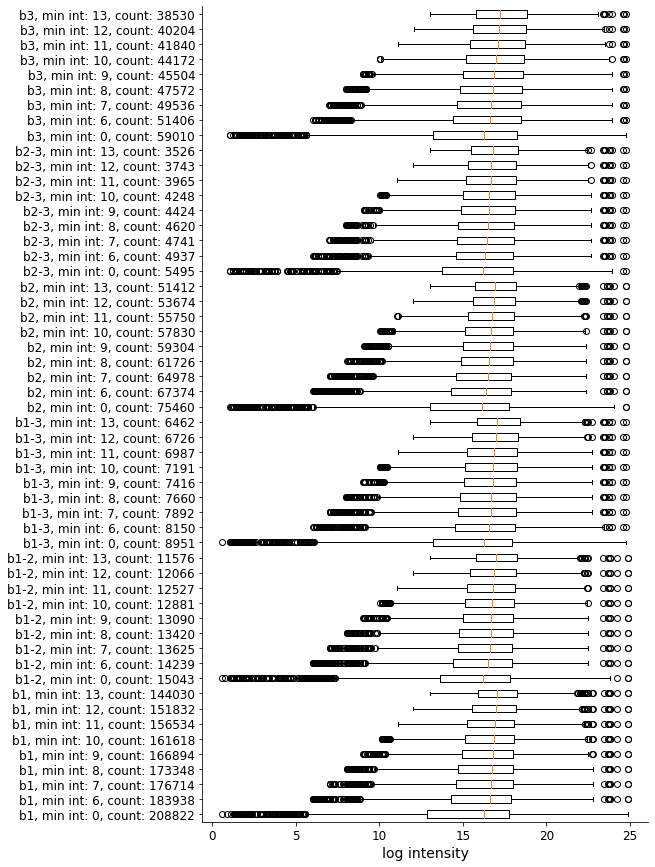

In [143]:
#### NOTE: this is dependent on which distance value is used above 1.5 or 2.82!!!!!
def get_intensities(b_corr, sorted_b_int_0, sorted_b_int_1, int_level):    
    seen = {}
    sim_ct = {}
    i = 0
    for coor_pair in b_corr:
        if coor_pair[0] == coor_pair[1]:
            continue
        if (sorted_b_int_1[coor_pair[1]].mean() < int_level or sorted_b_int_0[coor_pair[0]].mean() < int_level):
            continue
        i+=1
        if coor_pair[1] not in seen:
            seen[coor_pair[1]] = sorted_b_int_1[coor_pair[1]].mean()
        if coor_pair[0] not in seen:
            seen[coor_pair[0]] = sorted_b_int_0[coor_pair[0]].mean()
    return seen, sim_ct, i

# need something like: b7_corr but for the b7_b61 types....
def mixed_building_coor(dist_mat, z_norm_data):
    remap_col_name = {i:name for i, name in enumerate(z_norm_data.columns)}
    close_indicies = np.argwhere(dist_mat<dist_cut)
    close_indicies = close_indicies.tolist()
    close_indicies_remapped = []
    for ele in close_indicies:
        temp = []
        for ele_ in ele:
            temp.append(remap_col_name[ele_])
        close_indicies_remapped.append(temp)
    return close_indicies_remapped

## calculate all to all distance matricies for b1-b2 etc
b7_b61_dist = calc_distance_internal(z_norm_com_day_b_7, z_norm_com_day_b_61)
b7_b84_dist = calc_distance_internal(z_norm_com_day_b_7, z_norm_com_day_b_84)
b61_b84_dist = calc_distance_internal(z_norm_com_day_b_61, z_norm_com_day_b_84)
### calc the coorelation matricies for these to be ready for input like the solo building ones
b7_b61_corr = mixed_building_coor(b7_b61_dist,z_norm_com_day_b_7)
b7_b84_corr = mixed_building_coor(b7_b84_dist,z_norm_com_day_b_7)
b61_b84_corr = mixed_building_coor(b61_b84_dist,z_norm_com_day_b_7)

corrs = [b7_corr, b7_b61_corr, b7_b84_corr, b61_corr, b61_b84_corr, b84_corr]
b_ints = [[sorted_b_7,sorted_b_7], [sorted_b_7,sorted_b_61], [sorted_b_7,sorted_b_84], 
          [sorted_b_61, sorted_b_61], [sorted_b_61,sorted_b_84], [sorted_b_84, sorted_b_84]]
# going to have a dict of dicts where the first dict maps to a specific buildings, 
# then that building dict has a dict of intensity cutoffs that map to pair counts, and through time feature intensities
# but also directy extract the info for plotting
to_plot_ints = []
to_plot_labels = []
# combined_data = {str(i):{} for i in range(1,4)}
for b_corr, b_int,building in zip(corrs,b_ints, ['1','1-2','1-3','2','2-3','3']):
    for int_v in [0,6,7,8,9,10,11,12,13]:
        b_i, b_c, b_i_ct = get_intensities(b_corr, b_int[0],b_int[1], int_v)    
        to_plot_ints.append(list(b_i.values()))
        to_plot_labels.append('b{}, min int: {}, count: {}'.format(building, int_v, b_i_ct))
fig = plt.figure(figsize=(8, 15))
ax = plt.subplot()
ax.set_xlabel('log intensity', fontname='sans-serif', fontsize=14)
ax.tick_params(labelsize=12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.boxplot(to_plot_ints, labels=to_plot_labels, vert=False)
plt.savefig('SI_min_int_pairs_{}_new.svg'.format(str(dist_cut)[0]+'_'+str(dist_cut)[-1]), format='svg', dpi=1000, bbox_inches='tight')
plt.show()

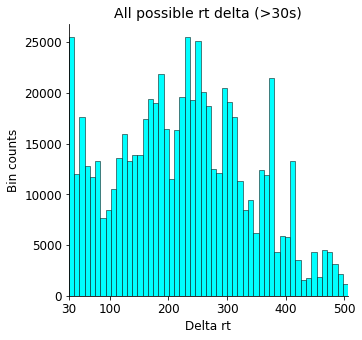

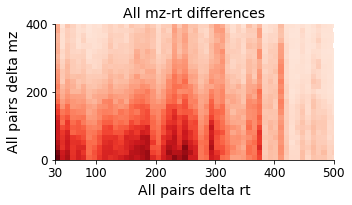

In [41]:
### showing histogram of RT delta distributions gt 30s

ret_times = peaks_data_og_with_metab['rt']
ret_times = np.reshape(ret_times.values, (-1,1))
time = 30
diffs = []
diff = ret_times - ret_times.T
diff = squareform(np.abs(diff))
diff_t = diff[diff>time]
fig = plt.figure(figsize=(5, 5))
ax = plt.subplot()
ax.set_xlim([30,506])
ax.set_xticks([30,100,200,300,400, 500])
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
_ = ax.hist(diff_t, bins=60,facecolor='cyan', edgecolor='black', linewidth=0.5)
ax.set_title('All possible rt delta (>30s)',fontname='sans-serif', fontsize=14)
ax.set_xlabel('Delta rt',fontname='sans-serif', fontsize=12)
ax.set_ylabel('Bin counts',fontname='sans-serif', fontsize=12)
plt.savefig('delta_rt_distribution.svg', format='svg', dpi=1000, bbox_inches='tight')  

mzs = peaks_data_og_with_metab['mz']
mzs = np.reshape(mzs.values, (-1,1))
diff_mz = mzs - mzs.T
diff_mz = squareform(np.abs(diff_mz))
diff_mz = diff_mz[diff>time]
diff_mz_n = diff_mz[diff_mz>0]
diff_t_n = diff_t[diff_mz>0]
fig = plt.figure(figsize=(5, 2.5))
ax = plt.subplot()
cmap = plt.get_cmap('Reds')
new_cmap = truncate_colormap(cmap,minval=0.1, maxval=1)
counts, xedges, yedges, im = ax.hist2d(diff_t_n, diff_mz_n, bins=60, cmin=0.1, cmap=new_cmap) # 60 bins 1.5, 75 for full
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_ylim([0,400])
ax.set_xlim([30,500])
ax.set_yticks([0,200,400])
ax.set_xticks([30, 100,200,300,400,500])
ax.set_title('All mz-rt differences'.format(b),fontname='sans-serif', fontsize=14)
ax.set_xlabel('All pairs delta rt',fontname='sans-serif', fontsize=14)
ax.set_ylabel('All pairs delta mz',fontname='sans-serif', fontsize=14)
for label in (ax.get_yticklabels()):
    label.set_fontsize(12)
    label.set_fontname('sans-serif')
for label in (ax.get_xticklabels()):
    label.set_fontsize(12)
    label.set_fontname('sans-serif')
plt.savefig('delta_mz_rt_full_distribution.svg', format='svg', dpi=1000, bbox_inches='tight')  

### Making figure 6: looking at other metab classes of interest - temporal dynamic + clusters etc

In [42]:
# get the indicies for all glucuronides 
glucuronides = []
for ind, row in peaks_data_og_with_metab.iterrows():
    best_comp = row['metfrag_matched_best_guess']
    if type(best_comp) == float:
        continue
    if 'glucur' in best_comp:
        glucuronides.append((ind,best_comp))

# aciclovir and other drugs        
caffeine = ['methylxanthine', 'paraxanthine', 'theophylline','theobromine', 'methyluracil', 'quinic' ] # 'ferulic acid 4-sulfate' is but 'ferulic acid 3-sulfate' isnt...
# removed :'methyluric', 'dimethyluric', since these are more urine related
caff = []
for ind, row in peaks_data_og_with_metab.iterrows():
    best_comp = row['metfrag_matched_best_guess']
    if type(best_comp) == float:
        continue
    for comp in caffeine:
        if comp in best_comp:
            caff.append((ind, best_comp))
            break

chocolates = ["valerolactone sulfate"]
choc = []
for ind, row in peaks_data_og_with_metab.iterrows():
    best_comp = row['metfrag_matched_best_guess']
    if type(best_comp) == float:
        continue
    for comp in chocolates:
        if comp in best_comp:
            choc.append((ind, best_comp))
                  
acetomenophens = ['paracetamol','acetaminophen' ]
acetomen = []
for ind, row in peaks_data_og_with_metab.iterrows():
    best_comp = row['metfrag_matched_best_guess']
    if type(best_comp) == float:
        continue
    for comp in acetomenophens:
        if comp in best_comp:
            acetomen.append((ind, best_comp))
            

diisop = ['diisopropyl sulfate']
dii = []
for ind, row in peaks_data_og_with_metab.iterrows():
    best_comp = row['metfrag_matched_best_guess']
    if type(best_comp) == float:
        continue
    for comp in diisop:
        if comp in best_comp:
            dii.append((ind, best_comp))             
            
urobilin = ['urobilin', 'bilin']
urob = []
for ind, row in peaks_data_og_with_metab.iterrows():
    best_comp = row['metfrag_matched_best_guess']
    if type(best_comp) == float:
        continue
    for comp in urobilin:
        if comp in best_comp:
            urob.append((ind, best_comp))

promazine = ['promazine']
prom = []
for ind, row in peaks_data_og_with_metab.iterrows():
    best_comp = row['metfrag_matched_best_guess']
    if type(best_comp) == float:
        continue
    for comp in promazine:
        if comp in best_comp:
            prom.append((ind, best_comp))

glucosides = []
for ind, row in peaks_data_og_with_metab.iterrows():
    best_comp = row['metfrag_matched_best_guess']
    if type(best_comp) == float:
        continue
    if 'glucosid' in best_comp:
        glucosides.append((ind,best_comp))     
#### looked at elsewhere in the manuscript
panthothenol = ['pantothenol']
pant = []
for ind, row in peaks_data_og_with_metab.iterrows():
    best_comp = row['metfrag_matched_best_guess']
    if type(best_comp) == float:
        continue
    for comp in panthothenol:
        if comp in best_comp:
            pant.append((ind, best_comp))  
            
ropin = ['ropinirole']
rop = []
for ind, row in peaks_data_og_with_metab.iterrows():
    best_comp = row['metfrag_matched_best_guess']
    if type(best_comp) == float:
        continue
    for comp in ropin:
        if comp in best_comp:
            rop.append((ind, best_comp))  

340 [('3-methylxanthine', 1.0)]
441 [('paraxanthine', 1.0), ('paraxanthine', 1.0)]
526 [('2-epi-valiolone', 1.0), ('quinic acid', 1.0)]
580 [('6-amino-5[n-methylformylamino]-1-methyluracil', 1.0), ('5-acetylamino-6-amino-3-methyluracil', 1.0)]
582 [('5-acetylamino-6-amino-3-methyluracil', 1.0), ('6-amino-5[n-methylformylamino]-1-methyluracil', 1.0)]
583 [('5-acetylamino-6-amino-3-methyluracil', 1.0), ('cymoxanil', 1.0)]


In [45]:
## databases for looking up metab class
db_path = '/home/ubuntu/data/mz_to_metab_mapping/'
dbs_name = {'chebi':'chebi_metabolites.pkl','hmdb':'hmdb_metabolites.pkl',
       'lipidmap':'lipidmap_metabolites.pkl','metacyc':'metacyc_metabolites.pkl'}
dbs = {'chebi':None,'hmdb':None,'lipidmap':None,'metacyc':None, 
       'lipid_msms':None, 'hmdb_msms':None, 'kegg_msms':None}
for db in dbs_name:
    db_ = pickle.load(open(os.path.join(db_path,dbs_name[db]), 'rb'))
    db_lc = {k.lower():v for k,v in db_.items() if type(k)==str}
    dbs[db] = db_lc

inchi_lookups = {'hmdb':None, 'lipidmap':None}
for ele in ['hmdb', 'lipidmap']:
    db = dbs[ele]
    new_db = {}
    for ent in db:
        new_db[db[ent]['inchikey']] = db[ent]
    inchi_lookups[ele] = new_db
    
extra_db_path = '/home/ubuntu/data/mz_to_metab_mapping/msms_pipeline_analysis/essentials/'
csv_dbs = ['lipidmaps.csv','kegg_2017-07-23.csv']
for db_name, csv in zip(['lipid_msms','kegg_msms'], csv_dbs): 
    msms_db = open(os.path.join(extra_db_path, csv), 'r')
    new_db = {}
    for line in msms_db:
        line = line.strip().split('","')
        if db_name == 'lipid_msms':
            new_db[line[0][1:].lower()] = {'mass':line[1],'formula':line[3],'class':line[5], 'sub_class':line[6],
                                           'inchi':line[8][6:], 'inchikey':'-'.join([line[9],line[10],line[12]])}
    dbs[db_name] = new_db



In [104]:
def accession_to_name(dbs):
    acc_to_name = {}
    for ele in dbs['hmdb']:
        for acc in dbs['hmdb'][ele]['hmdb_accession']:
            acc_to_name[acc] = ele
    return acc_to_name

def inchikey_to_name(dbs):
    inchi_to_name = {}
    for ele in dbs['hmdb']:
        inchikey = dbs['hmdb'][ele]['inchikey']
        inchi_to_name[inchikey] = ele
    return inchi_to_name

def inchi_to_name(dbs):
    inchi_to_name = {}
    for ele in dbs['hmdb']:
        inchi = dbs['hmdb'][ele]['inchi']
        inchi_to_name[inchi] = ele
    return inchi_to_name

### get the accessions matching to HMDB names:
acc_to_name_hmdb = accession_to_name(dbs)
### get the inchikey to name for HMDB:
inchikey_to_name_hmdb = inchikey_to_name(dbs)
### get the inchi to name for HMDB:
inchi_to_name_hmdb = inchi_to_name(dbs)

In [125]:
## class / sub_class / type analysis for stable and nonstable
## idea: take the labels, look up the compound in df, take the name and look into the DBs
def get_names(inds, name_df):
    names = list(name_df.loc[inds,'metfrag_matched_best_guess'].values)
    names_w_inds = [[n,i] for n,i in zip(names,inds)]
    total = len(names_w_inds)
    names_w_inds = [ele for ele in names_w_inds if 'Da/' not in ele[0]]
    num_remaining = len(names)
    removed = total - num_remaining
    names = [ast.literal_eval(ele[0]) for ele in names_w_inds]
    inds = [ele[1] for ele in names_w_inds]
    new_names = []
    new_inds = []
    for group,ind in zip(names,inds):
        new_group = []
        for chem in group:
            if len(chem) == 4 and 'C13' in chem[2]:
                continue
            if '**' in chem[0]:
                new_group.append(chem[0][:-2].lower())
            else:
                new_group.append(chem[0].lower())
        if len(new_group) == 0:
            num_remaining -= 1
            removed += 1
        else:
            new_names.append(new_group)
            new_inds.append(ind)
    return new_names, new_inds

def db_name_look_up(name, dbs):
    ### lipidmaps category = hmdb class
    ### lipidmaps main class = hmdb subclass
    ### lipidmaps sub class = hmdb direct parent
    db_info = []
    for db in ['hmdb','lipidmap', 'lipid_msms', 'chebi', 'metacyc']:
        db_info_ = []                
        try:
            chem = dbs[db][name]
            if db == 'hmdb':
                cats = ['class', 'sub_class', 'direct_parent']
            else:
                if chem['hmdb'] != None:
                    try:
                        if type(chem['hmdb']) == list:
                            for acc in chem['hmdb']:
                                try:
                                    hmdb_name = acc_to_name_hmdb[acc]
                                    chem = dbs['hmdb'][hmdb_name]
                                    cats = ['class', 'sub_class', 'direct_parent']
                                    break
                                except:
                                    pass
                        else:
                            hmdb_name = acc_to_name_hmdb[chem['hmdb']]
                            chem = dbs['hmdb'][hmdb_name]
                            cats = ['class', 'sub_class', 'direct_parent']
                    except:
                        try:
                            hmdb_name = inchikey_to_name_hmdb[chem['inchikey']]
                            chem = dbs['hmdb'][hmdb_name]
                            cats = ['class', 'sub_class', 'direct_parent']
                        except:
                            try:
                                hmdb_name = inchi_to_name_hmdb[chem['inchi']]
                                chem = dbs['hmdb'][hmdb_name]
                                cats = ['class', 'sub_class', 'direct_parent']
                            except:
                                cats = ['category','class','sub_class','super_class','inchikey','inchi']
                else:
                    try:
                        hmdb_name = inchikey_to_name_hmdb[chem['inchikey']]
                        chem = dbs['hmdb'][hmdb_name]
                        cats = ['class', 'sub_class', 'direct_parent']
                    except:
                        try:
                            hmdb_name = inchi_to_name_hmdb[chem['inchi']]
                            chem = dbs['hmdb'][hmdb_name]
                            cats = ['class', 'sub_class', 'direct_parent']
                        except:
                            cats = ['category','class','sub_class','super_class','inchikey','inchi']
            for ele in cats:
                try:
                    if type(chem[ele]) == list:
                        db_info_.append(chem[ele][0])
                    else:
                        db_info_.append(chem[ele])
                except:
                    db_info_.append(None)
            if len(db_info_) > 3:
                db_info_ = []
                try:
                    db_info_.append(chem['category'])
                    db_info_.append(chem['class'])
                    db_info_.append(chem['sub_class'])
                except:
                    db_info_.append(None)
            if set(db_info_) == set([None]):
                continue
            if db_info_ not in db_info:
                db_info.append(db_info_)
                break
        except:
            pass
    return db_info

def names_lookup(names_list, dbs):
    name_to_groups = {}
    for i, group in enumerate(names_list):
        group_info = []
        for chem in group:
            db_info = db_name_look_up(chem, dbs)
            if len(db_info) == 0:
                continue
            elif db_info[0] in group_info:
                continue
            else:
                group_info += db_info
        name_to_groups[i] = group_info
    return name_to_groups

def get_best_name(names, priority='last'):
    l1 = names[0]
    l2 = names[1]
    l3 = names[2]
    if priority == 'last':
        if l3 == None:
            if l2 == None:
                return l1
            else:
                return l2
        return l3
    elif priority == 'middle':
        if l2 == None:
            return l1
        else:
            return l2
    elif priority == 'first':
        return l1

def extract_names_from_class_dict(metab_class_dict, priority='last'):
    names = []
    if len(metab_class_dict[0]) == 0:
        return ['No chemical class info']
    for k,metab_groups in metab_class_dict.items():
        for sub_g in metab_groups:
            sub_g_class = get_best_name(sub_g, priority=priority)
            if sub_g_class not in names:
                names.append(sub_g_class)
    return names

Add the following to the figure caption
*5-dehydro-l-gluconate/d-glucuronic acid/iduronic acid/5-keto-d-gluconate, **neomenthol-glucuronide/(2s,3s)-2-hydroxytridecane-1,2,3-tricarboxylate/lmfa13010036/(2s,3s)-2-hydroxytridecane-1,2,3-tricarboxylic acid, ***5-(3',5'-dihydroxyphenyl)-gamma-valerolactone 3-o-glucuronide/5-(3',4'-dihydroxyphenyl)-gamma-valerolactone-4'-o-glucuronide, ****3-alpha-hydroxy-5-alpha-androstane-17-one 3-d-glucuronide/etiocholanolone glucuronide
Add the following to the figure caption
*5-acetylamino-6-amino-3-methyluracil/6-amino-5[n-methylformylamino]-1-methyluracil, **5-acetylamino-6-amino-3-methyluracil/6-amino-5[n-methylformylamino]-1-methyluracil
Add the following to the figure caption

Add the following to the figure caption
*hinokitiol glucoside/(3r,4r)-4,8-dihydroxy-3-((r)-2-hydroxypentyl)-6,7-dimethoxyisochroman-1-one, **methyl (3x,10r)-dihydroxy-11-dodecene-6,8-diynoate 10-glucoside/methyl 3,4-dihydroxy-5-prenylbenzoate 3-glucoside, ***5,6,7-trimethoxy-

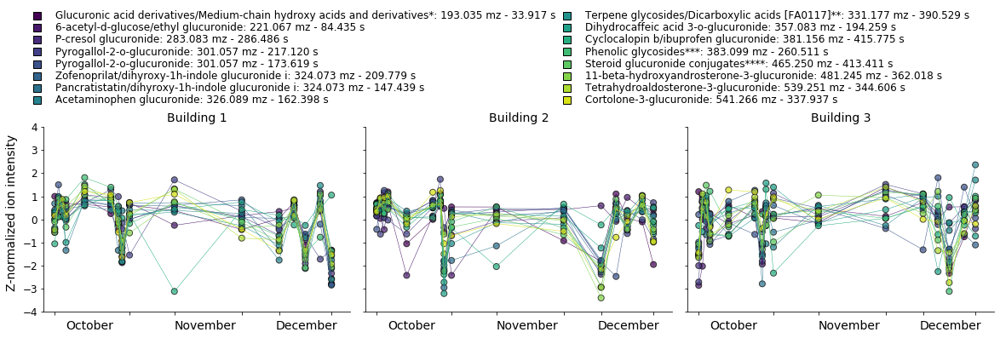

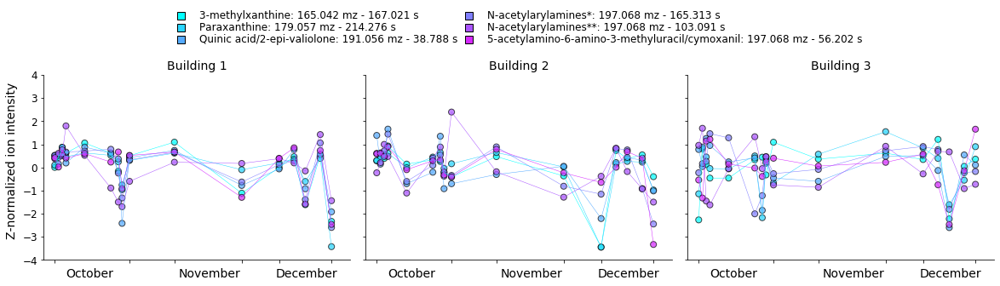

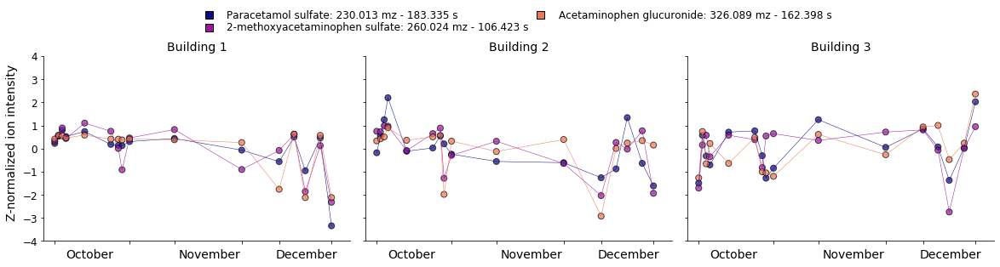

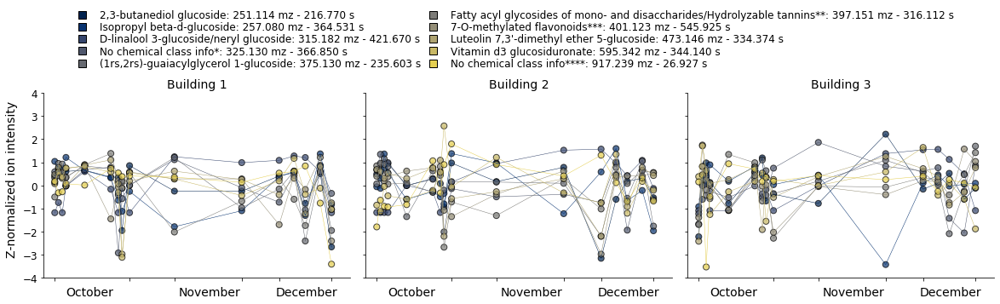

In [128]:
def plot_single_building_ts(ax, indicies, building):
    for index, c in zip(indicies, colors):
        ax.scatter([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75], building[index], c=[c for i in range(len([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75]))], s=50, alpha=0.7, edgecolor='k')
        ax.plot([1,2,3,4,9,16,18,19,21,33,51,61,65,68,72,75], building[index], c=c, linewidth=.5)
    ax.set_xticks([1,21,33,51,61,75])
    ax.set_xticklabels([])
    ax.set_ylim([-4,4])
    ax.set_xlim([-2,80])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for label in (ax.get_yticklabels()):
        label.set_fontsize(12)
        label.set_fontname('sans-serif')
    for label in (ax.get_xticklabels()):
        label.set_fontsize(12)
        label.set_fontname('sans-serif')
        
def plot_time_series_different_types(indicies, metab_type, z_norm, names, cmap):
    # glucur:legend 0.6, 1.68, ncol 2,  months: 4,33,60 yes >100 mask
    # caff: legend 0.6, 1.4, ncol 2, month: 4,34,60, no >100 mask
    # aceto: legend 0.5, 1.3, ncol 2 month: 4,34,60 no >100 mask
    # glucoside: legend 0.5, 1.5, ncol 3 month:  4,34,60 yes >100 mask
    if metab_type == 'Glucuronide-related': # 18
        m1,m2,m3 = 4,33,60
        bb_min,bb_max = 0.95,1.68
        mncol = 2
    elif metab_type == 'Caffeine-related': # 7
        m1,m2,m3 = 4,34,60
        bb_min,bb_max = 0.6,1.4
        mncol = 2
    elif metab_type == 'Acetaminophen-related': # 
        m1,m2,m3 = 4,34,60
        bb_min,bb_max = 0.5,1.3
        mncol = 2
    elif metab_type == 'Glucoside-related': #
        m1,m2,m3 = 4,34,60
        bb_min,bb_max = 0.9,1.5
        mncol = 2
    else:
        print('please use a working metab type')
        
    fig = plt.figure(figsize=(20,4))
    gs = GridSpec(1,3,figure=fig,wspace=0.05)
    if not z_norm:
        buildings = [sorted_b_7,sorted_b_61,sorted_b_84]
    else:
        buildings = [z_norm_com_day_b_7,z_norm_com_day_b_61,z_norm_com_day_b_84]
    for i, building in enumerate(buildings):
        ax = plt.subplot(gs[i])
        ax.set_title('Building {}'.format(i+1),fontname='sans-serif', fontsize=14)
        ax.text(m1,-4.75,'October',fontname='sans-serif', fontsize=14)
        ax.text(m2,-4.75,'November', fontname='sans-serif', fontsize=14)
        ax.text(m3,-4.75,'December', fontname='sans-serif', fontsize=14)
        if i != 0:
            ax.set_yticklabels([])
        else:
            ax.text(-12,-3,'Z-normalized ion intensity',fontname='sans-serif', fontsize=14, rotation=90)
        plot_single_building_ts(ax,indicies, building)
        
    legend_data = [[name, colors[i], 'k', 's'] for i,name in enumerate(names)]
    patches_bar = []
    for ele in legend_data:
        patches_bar.append(Line2D([0],[0], color='w', marker=ele[3],markerfacecolor=ele[1], markeredgecolor=ele[2], label=ele[0], markersize=9)) 
    font = font_manager.FontProperties(family='sans-serif', style='normal', size=12)
    lgd = ax.legend(handles=patches_bar, bbox_to_anchor=(bb_min,bb_max), frameon=False, prop=font, ncol=mncol, columnspacing=0.1, labelspacing=0.1) 
    plt.savefig('Fig6_{}_horiz_new.svg'.format(metab_type), format='svg', dpi=1000, bbox_inches='tight')

#### looking at z-normalized data or just log transformed?
z_norm = True
for metab_type in ['Glucuronide-related','Caffeine-related','Acetaminophen-related','Glucoside-related']: #
    if metab_type == 'Glucuronide-related': # 18
        cmap=plt.get_cmap('viridis')
        metab_ind = glucuronides
    elif metab_type == 'Caffeine-related': # 7
        cmap=plt.get_cmap('cool')
        metab_ind = caff
    elif metab_type == 'Acetaminophen-related': # 
        cmap=plt.get_cmap('plasma')
        metab_ind = acetomen
    elif metab_type == 'Glucoside-related': #
        cmap=plt.get_cmap('cividis')
        metab_ind = glucosides
    else:
        print('please use a working metab type')
    ### get the colors for the traces 
    colors = [cmap(float(i/len(metab_ind))) for i in range(len(metab_ind))]
    ### get the indicies and names, mz and rt
    metab_ind = [(ele[0],ele[1]) for ele in metab_ind if 'C13' not in ele[1]]
    inds = [ele[0] for ele in metab_ind]
    labs = [ele[1] for ele in metab_ind]
    mzs = list(peaks_data_og_with_metab.loc[inds]['mz'])
    rts = list(peaks_data_og_with_metab.loc[inds]['rt'])

    names = []
    for_caption = []
    match_to_legend = '*'
    for ele, mz, rt in zip(labs, mzs,rts):
        lab = ast.literal_eval(ele)
        lab = list(set([ele[0].lower() for ele in lab]))
        lab = [ele[:-2] if '**' in ele else ele for ele in lab]
        comp_types = names_lookup([lab], dbs)
        lab = '/'.join(lab)  +': {:.3f} mz - {:.3f} s'.format(mz, rt)
        if len(lab) > 75:
            for_caption.append(match_to_legend+lab.split(':')[0])
            ns = extract_names_from_class_dict(comp_types, priority='last')
            lab = '/'.join(ns) +'{}: {:.3f} mz - {:.3f} s'.format(match_to_legend,mz, rt)
            match_to_legend += '*'
        lab = lab[0].upper() + lab[1:]
        names.append(lab)
    print('Add the following to the figure caption')
    print(', '.join(for_caption))


    plot_time_series_different_types(inds, metab_type, z_norm, names, cmap)

In [129]:
### get the indicies for the select metabolites 
indicies_named = []
for l in [glucuronides, caff, acetomen, glucosides]:
    for comp in l:
        indicies_named.append(comp[0])
print(indicies_named)

[535, 767, 1126, 1240, 1241, 1359, 1360, 1368, 1395, 1473, 1541, 1545, 1751, 1770, 1831, 1836, 340, 441, 526, 580, 582, 583, 823, 996, 1368, 954, 981, 1320, 1364, 1521, 1591, 1600, 1763, 1880, 2157]


### what are new correlations found from this analysis. will focus on the named metabolites and their correlations. Particularly the named ones used in the paper

In [144]:
dist_c = 1.5
building_similar_features = []
for z_norm_b, b_b_dist in zip([z_norm_com_day_b_7,z_norm_com_day_b_61,z_norm_com_day_b_84],[b7_b7_dist, b61_b61_dist, b84_b84_dist]):
    delta_mz_, delta_rt_, close_ind = get_delta_mz_rt(z_norm_b, b_b_dist, dist_c)
    building_similar_features.append(close_ind)

b7_corr, b61_corr, b84_corr = building_similar_features

182.0095mz/294.7596s
215.033mz/34.8192s
221.0669mz/84.435s
228.1607mz/442.6324s
253.1197mz/199.1039s
254.9173mz/29.3975s
273.0079mz/255.3549s
297.117mz/429.7833s
324.0729mz/147.4386s
328.2134mz/473.3892s
329.2338mz/396.9101s


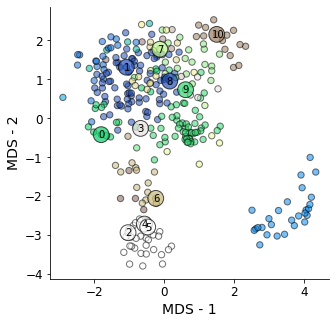

182.0095mz/294.7596s
195.0524mz/204.2426s
204.1242mz/189.3014s
228.1607mz/442.6324s
237.931mz/209.2619s
253.1197mz/199.1039s


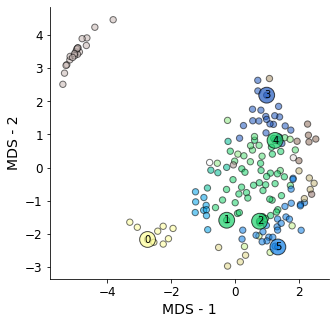

257.1955mz/491.0884s
301.0569mz/217.1195s
324.073mz/209.7786s


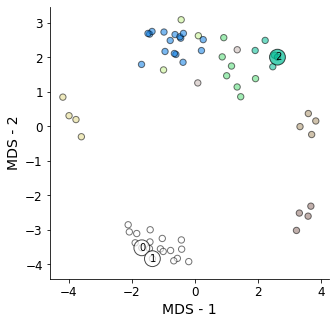

In [160]:
from sklearn import manifold
import matplotlib
cmap = matplotlib.cm.get_cmap('terrain')
## what is the minimum size of groups of temporally similar features do you want to keep
## note: here we are using a 1.5 euclidean distance calculated previously
## also note, this looks at only  the 'interesting' features that have come out of all the analyses....
#### this is: 'all_figs' from above
clust_size_min = [15,8,3]
### get all the intra building distances, just recalc incase the matricies have been changed:
b7_b7_dist = calc_distance_internal(z_norm_com_day_b_7, z_norm_com_day_b_7)
b61_b61_dist = calc_distance_internal(z_norm_com_day_b_61, z_norm_com_day_b_61)
b84_b84_dist = calc_distance_internal(z_norm_com_day_b_84, z_norm_com_day_b_84)
### make a map from the 0...1424 values to the real feature index
feat_to_ind = {feat:i for i, feat in enumerate(peaks_data_og_with_metab.index)}
indiv_building_feat_corr = {'b1':{}, 'b2':{}, 'b3':{}}
## look across each building and find the features that are similar to it...use a 1.5 A cutoff
for b_corr, b, c_min in zip([b7_corr, b61_corr, b84_corr], ['b1', 'b2', 'b3'],clust_size_min):
    for feat in all_figs:
        feat_l = []
        for corr in b_corr:
            if feat not in corr:
                continue
            if corr[0] == feat:
                feat_l.append(corr[1])
            else:
                feat_l.append(corr[0])
        ### need to also drop all the non related stuff to focus on these features
        ### so need list of all the correct indicies
        if len(list(set(feat_l))) > c_min:
            indiv_building_feat_corr[b][feat] = list(set(feat_l))

###### Trim the distance matricies to only have the interesting features with similarity groups larger than the cutoff
# have a dict that maps to other dicts where keys = the main compounds of interest, and values are list of close features
num_map = {'b1':{}, 'b2':{}, 'b3':{}}
# make lists for each buildings of the features to keep
ind_to_keep = {'b1':[], 'b2':[], 'b3':[]}
for b in indiv_building_feat_corr:
    for ele in indiv_building_feat_corr[b]:
        # this all makes use of the feature to matrix index mapping with feat_to_ind
        mat_ind = feat_to_ind[ele]
        # now make a similar dict of dicts mapping important feature matrix id to neighbor ids
        num_map[b][mat_ind] = [feat_to_ind[e] for e in indiv_building_feat_corr[b][ele]]
        ind_to_keep[b] += [mat_ind]
        ind_to_keep[b] += num_map[b][mat_ind]
    ind_to_keep[b] = sorted(list(set(ind_to_keep[b])))
    to_toss = [ele for ele in range(1425) if ele not in ind_to_keep[b]]
    if b == 'b1':
        b7_b7_dist = np.delete(b7_b7_dist,to_toss, axis=0)
        b7_b7_dist = np.delete(b7_b7_dist,to_toss, axis=1)
    elif b == 'b2':
        b61_b61_dist = np.delete(b61_b61_dist,to_toss, axis=0)
        b61_b61_dist = np.delete(b61_b61_dist,to_toss, axis=1)
    else:
        b84_b84_dist = np.delete(b84_b84_dist,to_toss, axis=0)
        b84_b84_dist = np.delete(b84_b84_dist,to_toss, axis=1)

#### for ALL feat matrix indicies, get the size of that clusters it is associated with
#### this is because often one feature is <1.5 distance from multiple of the keys!
num_map_size = {'b1':{}, 'b2':{}, 'b3':{}}
for b in num_map:
    for ele in num_map[b]:
        for e2 in num_map[b][ele]:
            if e2 in num_map_size[b]:
                num_map_size[b][e2].append((ele,len(num_map[b][ele])))
            else:
                num_map_size[b][e2] = [(ele,len(num_map[b][ele]))]
    
# get colors from the num_map 
### IMPORTANT: this is a list of the matrix indicies 
building_features = {'b1':[], 'b2':[], 'b3':[]}
for b in num_map:
    for i,ele in enumerate(num_map[b]):
        building_features[b] += [(ele,i)]
        building_features[b] += [(e,i) for e in num_map[b][ele]]
    building_features[b] = sorted(list(set(building_features[b])), key=lambda x:x[0])

### now get the final color list since currently most features can be in many clusters, take the color of the largest
### cluster it is in. 
building_feat_colors = {'b1':[], 'b2':[], 'b3':[]}
for b in building_features:
    colors = []
    current = -1
    for ele in building_features[b]:
        if ele[0] != current:
            current = ele[0]
            possible_groups = sorted(num_map_size[b][ele[0]], key=lambda x:x[1], reverse=True) #x[1] is the cluster size, x[0] is the parent feature
            best_group = possible_groups[0][0]
            colors.append(best_group)   
    color_map = {}
    i = 1
    for ele in colors:
        if ele not in color_map:
            color_map[ele] = i
            i += 1
        else:
            pass
    color_map = {ele:color_map[ele]/(len(color_map)) for ele in color_map}
    colors = [cmap(color_map[c]) for c in colors]
    building_feat_colors[b] = colors

### fit MDS models to project distance matricies of interest to look at grouping  
all_labels = []
all_names = []
for b in ['b1','b2','b3']:
    fig = plt.figure(figsize=(5, 5))
    ax = plt.subplot()
    if b == 'b1':
        bb_dist = b7_b7_dist 
    elif b == 'b2':
        bb_dist = b61_b61_dist 
    else:
        bb_dist = b84_b84_dist

    mds = manifold.MDS(n_components=2, max_iter=3000, eps=1e-9,
                       dissimilarity="precomputed", n_jobs=1)
    embed = mds.fit(bb_dist).embedding_
    ## get name and locations of important metabs
    loc_color_label = []
    for i,ele in enumerate(zip(ind_to_keep[b],building_feat_colors[b])):
        if ele[0] in all_figs:
            n = peaks_data_og_with_metab.loc[ele[0], 'metfrag_matched_best_guess']
            mz_rt = str(round(peaks_data_og_with_metab.loc[ele[0],'mz'],4)) + 'mz/'+ str(round(peaks_data_og_with_metab.loc[ele[0],'rt'],4)) +'s'
            print(mz_rt)
            n = n + ' - ' + mz_rt
            if '-containing' in n:
                n = mz_rt
            loc_color_label.append([embed[i,:], ele[1],n])
    loc_color_label = sorted(loc_color_label, key=lambda x:x[0][0])
    spec_loc = []
    spec_color = []
    spec_name = []
    spec_label = []
    for i, ele in enumerate(loc_color_label):
        spec_loc.append(ele[0])
        spec_color.append(ele[1])
        spec_name.append(ele[2])
        spec_label.append(i)
    all_labels += spec_label
    all_names += spec_name
    ax.set_xlabel('MDS - 1', fontname='sans-serif', fontsize=14)
    ax.set_ylabel('MDS - 2', fontname='sans-serif', fontsize=14)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.tick_params(direction='out')
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(12)
        tick.label.set_fontname('sans-serif')
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(12)
        tick.label.set_fontname('sans-serif')
    ax.scatter(embed[:, 0], embed[:, 1], color=building_feat_colors[b], s=40, edgecolor='k', alpha=0.55)
    ax.scatter([ele[0] for ele in spec_loc], [ele[1] for ele in spec_loc], s=250, edgecolor='k', color=spec_color, alpha=0.7)
    for label, position in zip(spec_label, spec_loc):
        if label>9:
            x_offset = -0.135
        else:
            x_offset = -0.085
        y_offset = -0.09
        ax.annotate(str(label), xy=(position[0], position[1]), xytext=(position[0]+x_offset, position[1]+y_offset), fontsize=10)
    plt.savefig('Figure_8_{}_new.svg'.format(b), format='svg', dpi=1000, bbox_inches='tight')
    plt.show()

    

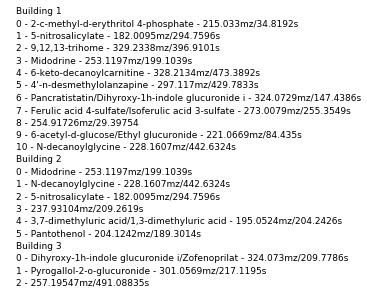

In [180]:
## getting the labels for the numbered dots above
fig = plt.figure(figsize=(5, 5))
ax = plt.subplot()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim([1,len(all_names)+3])


names = []
ys = []
building = 1
y = 1
for name, num_lab in zip(all_names, all_labels):
    ys.append(y)
    y += 1
    if num_lab == 0:
        names.append('Building '+str(building))
        building += 1
        ys.append(y)
        y += 1
    if ' - ' in name:
        name_list = name.split(' - ')
        name = name_list[0]
        mz_rt = name_list[1]
    try:
        name = ast.literal_eval(name)
    except:
        try:
            n = name.split('Da/')
            name = n[0]+'mz/'+n[1]
        except:
            name = name[:-2]+'s'
    if type(name) == str:
#         final_name = str(num_lab) + ' - ' + mz_rt
        final_name = str(num_lab) + ' - ' + name
    elif len(name[0]) == 2:
        labels = []
        for n in name:
            labels.append(n[0][0].upper()+n[0][1:])
        if '9,12,13-trihome' in labels:
            labels = ['9,12,13-trihome']
        full_poss = str(num_lab) + ' - ' + '/'.join(labels)
        if len(full_poss) > 70:
            print(full_poss)
            temp = full_poss.split('/')
            temp[3]+='\n'
            full_poss = '/'.join(temp)
            ys.append(y)
            y += 1
            names.append('')
        final_name = full_poss + ' - ' + mz_rt
    else:
        labels = []
        for n in name:
            n = n[0][:-2]+'^'+' {} ppm'.format(n[1])
            labels.append(n[0].upper()+n[1:])
        final_name = str(num_lab) + ' - ' + '/'.join(labels)
        final_name = final_name + ' - ' + mz_rt
    names.append(final_name)
ys = ys[::-1]
for y,text in zip(ys, names):
    ax.text(0.03,y-.25,text, fontsize=9, fontname='sans-serif')
plt.savefig('Figure_8_labels_new.svg'.format(b), format='svg', dpi=1000, bbox_inches='tight')


## this shows that some metabolites cluster together in different buildings. but does not imply they have the same dynamics between buildings (not actually looked at but most likely they do not)

[[('7,8-dihydroxy-3,4,15-triacetoxyscirpenol**', '1.361', 'M-H_meta', 'C21H28O10')], [('2-deoxy-ribonic acid', 1.0), ('2-deoxypentonic acid', 1.0), ('arabinofuranose', 1.0), ('d-apiose', 1.0), ('beta-d-ribopyranose', 1.0), ('r-thmf', 1.0), ('apiose', 1.0), ('d-arabinofuranose', 1.0)], [('carnocin u i49', 1.0)], [('n-methylanthranilate', 1.0), ('n-methyl-4-aminobenzoate', 1.0), ('2-(methylamino)benzoic acid', 1.0)], [('isoleucyl-hydroxyproline', 1.0), ('leucyl-hydroxyproline', 1.0)], [('cytomycin**', '1.413', 'M-H_meta', 'C17H23N7O5')], [('l-2,3-dihydrodipicolinate', 1.0), ('2-furoylglycine', 1.0)], [('cortolone-3-glucuronide', 1.0)], ['433.20849mz/348.56224'], [('fatty acid 16:4**', '2.724', 'M-2H_Na_chebi', 'C16H24O2')], [('azoxybacilin**', '4.445', 'M-2H_Na_chebi', 'C5H11N3O3')], [('2,4-dihydroxybutanoic acid', 1.0), ('4-deoxy-erythronic acid', 1.0), ('d-threose', 1.0), ('2,4-dihydroxybutanoic acid', 1.0), ('4-deoxythreonic acid', 1.0)], [('(2s,3s)-2-hydroxytridecane-1,2,3-tricarboxy

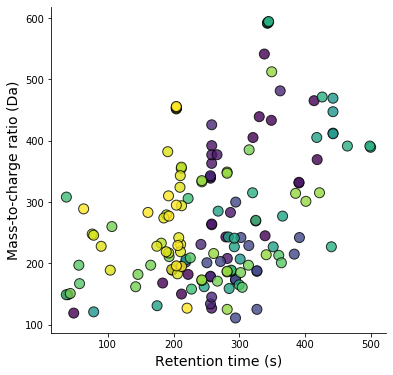

In [246]:
#### find the general co-occurance of metabolites in clusters across buildings
#### for each cluster in B7, whats its intersection with each cluster in the other buildings? 
## these are dictionaries mapping cluster to list. 

three = True
if not three:
    b_1 = 'b1'
    b_2 = 'b2'
    name_to_data = {'b1':cluster_members_7, 'b2':cluster_members_61, 'b3':cluster_members_84}
    cluster_mem_1 = name_to_data[b_1]
    cluster_mem_2 = name_to_data[b_2]
    large_coclust = []
    for c_b1 in cluster_mem_1:
        c_1 = set(cluster_mem_1[c_b1])
        for c_b2 in cluster_mem_2:
            c_2 =  set(cluster_mem_2[c_b2])
            c_1_2 = c_1 & c_2
            if len(c_1_2) > 5:
                large_coclust.append(c_1_2)
if three:          
    b_1 = 'b1'
    b_2 = 'b2'
    b_3 = 'b3'
    name_to_data = {'b1':cluster_members_7, 'b2':cluster_members_61, 'b3':cluster_members_84}
    cluster_mem_1 = name_to_data[b_1]
    cluster_mem_2 = name_to_data[b_2]
    cluster_mem_3 = name_to_data[b_3]
    large_coclust = []
    for c_b1 in cluster_mem_1:
        c_1 = set(cluster_mem_1[c_b1])
        for c_b2 in cluster_mem_2:
            c_2 =  set(cluster_mem_2[c_b2])
            for c_b3 in cluster_mem_3: 
                c_3 =  set(cluster_mem_2[c_b3])
                c_1_2_3 = c_1 & c_2 & c_3
                if len(c_1_2_3) > 5:
                    large_coclust.append(c_1_2_3)

# ##### plot the mz and rt of each of these clusters. color each grouping a different color...
# peaks_data_og_with_metab will be used to map the ID to get 'rt' and 'mz'
mzs = []
rts = []
colors = []
names = []
for i, group in enumerate(large_coclust):
    group = list(group)
    mz = peaks_data_og_with_metab.loc[group, 'mz']
    rt = peaks_data_og_with_metab.loc[group, 'rt']
    if rt.max() - rt.min() < 30:
        continue
    mzs += list(mz.values)
    rts += list(rt.values)
    name = peaks_data_og_with_metab.loc[group,'metfrag_matched_best_guess']
    name = list(name.values)
    new_names = []
    for poss_names, mz,rt in zip(name, list(mz.values),list(rt.values)):
        try:
            poss_names = ast.literal_eval(poss_names)
        except:
            poss_names = ['mz'.join(poss_names.split('Da'))]
            pass
        if len(poss_names[0]) == 4:
            if (float(poss_names[0][1]) > 5.25 or 'C13' in poss_names[0][2]):
                poss_names = [str(mz)+'mz/'+str(rt)+'s']
        new_names.append(poss_names)
    for num in range(len(group)):
        colors.append(i+1)
    print(new_names)
fig = plt.figure(figsize=(6,6))
ax = plt.subplot()
colors = np.asarray(colors)
ax.scatter(rts,mzs,s=100,alpha=0.8,c=colors, edgecolor='k')
ax.set_xlabel('Retention time (s)', fontname='sans-serif', fontsize=14)
ax.set_ylabel('Mass-to-charge ratio (Da)', fontname='sans-serif', fontsize=14)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(10)
for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(10)
if three:
    plt.savefig('SI_cocluster_across_buildings_{}_{}_{}_new.svg'.format(b_1, b_2, b_3), format='svg', dpi=1000, bbox_inches='tight')
else:
    plt.savefig('SI_cocluster_across_buildings_{}_{}_new.svg'.format(b_1, b_2), format='svg', dpi=1000, bbox_inches='tight')
plt.show()